# Data Visualization Tools

<img src="images/DescriptiveStatistics.png"/>

### Data Set: Kiva

**Kiva.org** is an online crowdfunding platform to extend financial services to poor and financially excluded people around the world. Kiva lenders have provided over $1 billion dollars in loans to over 2 million people. In order to set investment priorities, help inform lenders, and understand their target communities, knowing the level of poverty of each borrower is critical. However, this requires inference based on a limited set of information for each borrower.

Data source: https://www.kaggle.com/kiva/data-science-for-good-kiva-crowdfunding

### General Libraries 

In [51]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

import warnings
warnings.filterwarnings("ignore")

In [52]:
# Load in kiva_loans.csv as df
df = pd.read_csv("data/kiva_loans.csv")

df.head()

,id,funded_amount,loan_amount,activity,sector,use,country_code,country,region,currency,partner_id,posted_time,disbursed_time,funded_time,term_in_months,lender_count,tags,borrower_genders,repayment_interval,date
0,653051,300.0,300.0,Fruits & Vegetables,Food,"To buy seasonal, fresh fruits to sell.",PK,Pakistan,Lahore,PKR,247.0,2014-01-01 06:12:39+00:00,2013-12-17 08:00:00+00:00,2014-01-02 10:06:32+00:00,12.0,12,NaN,female,irregular,2014-01-01
1,653053,575.0,575.0,Rickshaw,Transportation,to repair and maintain the auto rickshaw used ...,PK,Pakistan,Lahore,PKR,247.0,2014-01-01 06:51:08+00:00,2013-12-17 08:00:00+00:00,2014-01-02 09:17:23+00:00,11.0,14,NaN,"female, female",irregular,2014-01-01
2,653068,150.0,150.0,Transportation,Transportation,To repair their old cycle-van and buy another ...,IN,India,Maynaguri,INR,334.0,2014-01-01 09:58:07+00:00,2013-12-17 08:00:00+00:00,2014-01-01 16:01:36+00:00,43.0,6,"user_favorite, user_favorite",female,bullet,2014-01-01
3,653063,200.0,200.0,Embroidery,Arts,to purchase an embroidery machine and a variet...,PK,Pakistan,Lahore,PKR,247.0,2014-01-01 08:03:11+00:00,2013-12-24 08:00:00+00:00,2014-01-01 13:00:00+00:00,11.0,8,NaN,female,irregular,2014-01-01
4,653084,400.0,400.0,Milk Sales,Food,to purchase one buffalo.,PK,Pakistan,Abdul Hakeem,PKR,245.0,2014-01-01 11:53:19+00:00,2013-12-17 08:00:00+00:00,2014-01-01 19:18:51+00:00,14.0,16,NaN,female,monthly,2014-01-01


In [53]:
#check the summary of the data
df.describe()

,id,funded_amount,loan_amount,partner_id,term_in_months,lender_count
count,6.712050e+05,671205.000000,671205.000000,657698.000000,671205.000000,671205.000000
mean,9.932486e+05,785.995061,842.397107,178.199616,13.739022,20.590922
std,1.966113e+05,1130.398941,1198.660073,94.247581,8.598919,28.459551
min,6.530470e+05,0.000000,25.000000,9.000000,1.000000,0.000000
25%,8.230720e+05,250.000000,275.000000,126.000000,8.000000,7.000000
50%,9.927800e+05,450.000000,500.000000,145.000000,13.000000,13.000000
75%,1.163653e+06,900.000000,1000.000000,204.000000,14.000000,24.000000
max,1.340339e+06,100000.000000,100000.000000,536.000000,158.000000,2986.000000


In [54]:
# Check the info of the data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 671205 entries, 0 to 671204
Data columns (total 20 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   id                  671205 non-null  int64  
 1   funded_amount       671205 non-null  float64
 2   loan_amount         671205 non-null  float64
 3   activity            671205 non-null  object 
 4   sector              671205 non-null  object 
 5   use                 666973 non-null  object 
 6   country_code        671197 non-null  object 
 7   country             671205 non-null  object 
 8   region              614405 non-null  object 
 9   currency            671205 non-null  object 
 10  partner_id          657698 non-null  float64
 11  posted_time         671205 non-null  object 
 12  disbursed_time      668809 non-null  object 
 13  funded_time         622874 non-null  object 
 14  term_in_months      671205 non-null  float64
 15  lender_count        671205 non-nul

In [55]:
# Drop all the null values and save the new datafarame in df_dropped
# check the info of the dropped dated
df_dropped = df.dropna()
df_dropped.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 423081 entries, 2 to 671141
Data columns (total 20 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   id                  423081 non-null  int64  
 1   funded_amount       423081 non-null  float64
 2   loan_amount         423081 non-null  float64
 3   activity            423081 non-null  object 
 4   sector              423081 non-null  object 
 5   use                 423081 non-null  object 
 6   country_code        423081 non-null  object 
 7   country             423081 non-null  object 
 8   region              423081 non-null  object 
 9   currency            423081 non-null  object 
 10  partner_id          423081 non-null  float64
 11  posted_time         423081 non-null  object 
 12  disbursed_time      423081 non-null  object 
 13  funded_time         423081 non-null  object 
 14  term_in_months      423081 non-null  float64
 15  lender_count        423081 non-nul

In [56]:
# How many records have been lost as a result of dropping all the null values (records lost)
671205 - 423081 

248124

In [57]:
# check for any null values
df.isnull().any()

id                    False
funded_amount         False
loan_amount           False
activity              False
sector                False
use                    True
country_code           True
country               False
region                 True
currency              False
partner_id             True
posted_time           False
disbursed_time         True
funded_time            True
term_in_months        False
lender_count          False
tags                   True
borrower_genders       True
repayment_interval    False
date                  False
dtype: bool

In [58]:
# Filling USE with RECORD UNKNOWN
df['use'].fillna("RECORD_UNKNOWN",inplace=True)

In [59]:
# Display the use column as a dataframe
df[['use']]

,use
0,"To buy seasonal, fresh fruits to sell."
1,to repair and maintain the auto rickshaw used ...
2,To repair their old cycle-van and buy another ...
3,to purchase an embroidery machine and a variet...
4,to purchase one buffalo.
...,...
671200,"[True, u'para compara: cemento, arenya y ladri..."
671201,"[True, u'to start a turducken farm.'] - this l..."
671202,RECORD_UNKNOWN
671203,"[True, u'to start a turducken farm.'] - this l..."


In [60]:
# Filling region with Unknown_Region
df['region'].fillna("Unknown_Region",inplace=True)

In [61]:
# Display the region column as a dataframe
df[['region']]

,region
0,Lahore
1,Lahore
2,Maynaguri
3,Lahore
4,Abdul Hakeem
...,...
671200,Concepción
671201,Unknown_Region
671202,Unknown_Region
671203,Unknown_Region


In [62]:
# Create a New column that contains the year from the date column
def create_year(x):
    year = pd.DatetimeIndex(x).year 
    return year

df['year'] = create_year(df['date'])
df.head(1)

,id,funded_amount,loan_amount,activity,sector,use,country_code,country,region,currency,...,posted_time,disbursed_time,funded_time,term_in_months,lender_count,tags,borrower_genders,repayment_interval,date,year
0,653051,300.0,300.0,Fruits & Vegetables,Food,"To buy seasonal, fresh fruits to sell.",PK,Pakistan,Lahore,PKR,...,2014-01-01 06:12:39+00:00,2013-12-17 08:00:00+00:00,2014-01-02 10:06:32+00:00,12.0,12,NaN,female,irregular,2014-01-01,2014


In [63]:
# Create a New column that contains the month from the date column
def create_month(x):
    month = pd.DatetimeIndex(x).month_name() 
    return month

df['month'] = create_month(df['date'])
df.head(1)

,id,funded_amount,loan_amount,activity,sector,use,country_code,country,region,currency,...,disbursed_time,funded_time,term_in_months,lender_count,tags,borrower_genders,repayment_interval,date,year,month
0,653051,300.0,300.0,Fruits & Vegetables,Food,"To buy seasonal, fresh fruits to sell.",PK,Pakistan,Lahore,PKR,...,2013-12-17 08:00:00+00:00,2014-01-02 10:06:32+00:00,12.0,12,NaN,female,irregular,2014-01-01,2014,January


In [64]:
# Create a New column that contains the day from the date column

def create_day(x):
    day = pd.DatetimeIndex(x).day_name() 
    return day

df['day'] = create_day(df['date'])
df.head(1)

,id,funded_amount,loan_amount,activity,sector,use,country_code,country,region,currency,...,funded_time,term_in_months,lender_count,tags,borrower_genders,repayment_interval,date,year,month,day
0,653051,300.0,300.0,Fruits & Vegetables,Food,"To buy seasonal, fresh fruits to sell.",PK,Pakistan,Lahore,PKR,...,2014-01-02 10:06:32+00:00,12.0,12,NaN,female,irregular,2014-01-01,2014,January,Wednesday


In [65]:
# Print the unique country names
df['country'].unique()

array(['Pakistan', 'India', 'Kenya', 'Nicaragua', 'El Salvador',
       'Tanzania', 'Philippines', 'Peru', 'Senegal', 'Cambodia',
       'Liberia', 'Vietnam', 'Iraq', 'Honduras', 'Palestine', 'Mongolia',
       'United States', 'Mali', 'Colombia', 'Tajikistan', 'Guatemala',
       'Ecuador', 'Bolivia', 'Yemen', 'Ghana', 'Sierra Leone', 'Haiti',
       'Chile', 'Jordan', 'Uganda', 'Burundi', 'Burkina Faso',
       'Timor-Leste', 'Indonesia', 'Georgia', 'Ukraine', 'Kosovo',
       'Albania', 'The Democratic Republic of the Congo', 'Costa Rica',
       'Somalia', 'Zimbabwe', 'Cameroon', 'Turkey', 'Azerbaijan',
       'Dominican Republic', 'Brazil', 'Mexico', 'Kyrgyzstan', 'Armenia',
       'Paraguay', 'Lebanon', 'Samoa', 'Israel', 'Rwanda', 'Zambia',
       'Nepal', 'Congo', 'Mozambique', 'South Africa', 'Togo', 'Benin',
       'Belize', 'Suriname', 'Thailand', 'Nigeria', 'Mauritania',
       'Vanuatu', 'Panama', 'Virgin Islands',
       'Saint Vincent and the Grenadines',
       "Lao Peo

In [66]:
# How many unique countries are there
df['country'].nunique()

87

In [67]:
# Create a dataframe called sectors that contains the count of the number of times a sector appears in the dataset
sectors = df.groupby('sector')['id'].count().sort_values(ascending=False).reset_index()
sectors.head()

,sector,id
0,Agriculture,180302
1,Food,136657
2,Retail,124494
3,Services,45140
4,Personal Use,36385


In [68]:
# Rename the id column to count
sectors.columns = ['Sector','Count']
sectors.head()

,Sector,Count
0,Agriculture,180302
1,Food,136657
2,Retail,124494
3,Services,45140
4,Personal Use,36385


In [69]:
# Create a dataframe called sector_loan that contains the count of the loan
# amounts per sector
sector_loan=df.groupby('sector')['loan_amount'].count().\
sort_values(ascending=False).reset_index()
sector_loan.head()

,sector,loan_amount
0,Agriculture,180302
1,Food,136657
2,Retail,124494
3,Services,45140
4,Personal Use,36385


In [70]:
# Check the type of sector_loan
type(sector_loan)

pandas.core.frame.DataFrame

In [71]:
# Create a dataframe called usa that contains data from USA only
usa = df[df['country'] == 'United States']
usa.head(1)

,id,funded_amount,loan_amount,activity,sector,use,country_code,country,region,currency,...,funded_time,term_in_months,lender_count,tags,borrower_genders,repayment_interval,date,year,month,day
99,1080153,5000.0,5000.0,Food Production/Sales,Food,hire more staff to keep up with the volume of ...,US,United States,Unknown_Region,USD,...,2014-03-11 05:53:06+00:00,30.0,261,NaN,female,monthly,2014-01-02,2014,January,Thursday


In [72]:
# Create a pivot table that shows the sum of loan amounts per sector
pd.pivot_table(usa, values='loan_amount',columns=['sector'],aggfunc='sum')

sector,Agriculture,Arts,Clothing,Construction,Education,Entertainment,Food,Health,Housing,Manufacturing,Personal Use,Retail,Services,Transportation,Wholesale
loan_amount,2999050.0,1351500.0,1957925.0,435900.0,870125.0,776725.0,7209975.0,396450.0,242850.0,213300.0,481775.0,4437450.0,9420300.0,597925.0,105125.0


In [73]:
# Load in the themes data as themes
themes = pd.read_csv('data/loan_theme_ids.csv')
themes.head()

,id,Loan Theme ID,Loan Theme Type,Partner ID
0,638631,a1050000000skGl,General,151.0
1,640322,a1050000000skGl,General,151.0
2,641006,a1050000002X1ij,Higher Education,160.0
3,641019,a1050000002X1ij,Higher Education,160.0
4,641594,a1050000002VbsW,Subsistence Agriculture,336.0


In [74]:
# Display the columns in the themes dataset
themes.columns

Index(['id', 'Loan Theme ID', 'Loan Theme Type', 'Partner ID'], dtype='object')

In [75]:
# Display the columns in df
df.columns

Index(['id', 'funded_amount', 'loan_amount', 'activity', 'sector', 'use',
       'country_code', 'country', 'region', 'currency', 'partner_id',
       'posted_time', 'disbursed_time', 'funded_time', 'term_in_months',
       'lender_count', 'tags', 'borrower_genders', 'repayment_interval',
       'date', 'year', 'month', 'day'],
      dtype='object')

In [76]:
# Merge the themes data frame with df
# and display the merged data frame
merger = pd.merge(df,themes, on='id')
merger.head(1)

,id,funded_amount,loan_amount,activity,sector,use,country_code,country,region,currency,...,tags,borrower_genders,repayment_interval,date,year,month,day,Loan Theme ID,Loan Theme Type,Partner ID
0,653053,575.0,575.0,Rickshaw,Transportation,to repair and maintain the auto rickshaw used ...,PK,Pakistan,Lahore,PKR,...,NaN,"female, female",irregular,2014-01-01,2014,January,Wednesday,a1050000000sjEC,Underserved,247.0


In [77]:
# Print the unique loan theme types
merger['Loan Theme Type'].unique()

array(['Underserved', 'General', nan, "Hai Duong Women's Union", 'Youth',
       'Green', 'Higher Education', 'Rural Inclusion', 'Startup',
       'Full Tuition', 'At-Risk Youth', 'Conflict Zone',
       'Extreme Poverty', 'Water', 'FUSAI', 'Subsistence Agriculture',
       'Agriculture', 'Housing Improvement', 'Unbanked',
       'Youth Entrepreneurship', 'Haiti', 'Vulnerable Populations',
       'Primary/Secondary Education', 'Vulnerable Women', 'Murabaha',
       'End Consumer Finance', 'Agricultural Equipment',
       'Mobile Transactions', 'Small Enterprise', 'Business in a Box',
       'Artisan', 'Murabaha Youth', 'Retailer Finance', 'Kiva City LA',
       'Organic Conversion', 'First/Second Chance', 'Disaster Recovery',
       'Agricultural Infrastructure', 'Women Without Poverty',
       'CAMEO Partnership', 'Safe Water System for Institution',
       'Rural Conflict Zone', 'Biodigester', 'SME',
       'Clients below the poverty line', 'Distributor Finance - India',
       'Busi

In [78]:
# Which are the most prominent loan themes by id count
merger.groupby('Loan Theme Type')['id'].count().\
sort_values(ascending=False).reset_index().head(5)

,Loan Theme Type,id
0,General,337812
1,Underserved,52296
2,Agriculture,31526
3,Rural Inclusion,18637
4,Water,16304


## Visualization with MatplotLib

In [79]:
usa.head()

,id,funded_amount,loan_amount,activity,sector,use,country_code,country,region,currency,...,funded_time,term_in_months,lender_count,tags,borrower_genders,repayment_interval,date,year,month,day
99,1080153,5000.0,5000.0,Food Production/Sales,Food,hire more staff to keep up with the volume of ...,US,United States,Unknown_Region,USD,...,2014-03-11 05:53:06+00:00,30.0,261,NaN,female,monthly,2014-01-02,2014,January,Thursday
116,653415,4000.0,4000.0,Cosmetics Sales,Retail,to purchase more inventory to sell,US,United States,San Diego,USD,...,2014-01-17 19:56:39+00:00,26.0,93,"#Refugee, #Woman Owned Biz, #Inspiring Story, ...",female,monthly,2014-01-02,2014,January,Thursday
231,1080154,10000.0,10000.0,Food Production/Sales,Food,outfit my new kitchen so that I can expand my ...,US,United States,Unknown_Region,USD,...,2014-02-20 12:08:03+00:00,36.0,280,NaN,female,monthly,2014-01-02,2014,January,Thursday
455,653761,5000.0,5000.0,Farming,Agriculture,to purchase a tractor,US,United States,"Pauma Valley, CA",USD,...,2014-01-13 19:33:49+00:00,32.0,158,"#Biz Durable Asset, #Vegan, #Inspiring Story, ...",male,monthly,2014-01-03,2014,January,Friday
474,653803,5450.0,5450.0,Services,Services,to market her new business.,US,United States,"Baton Rouge, Louisiana",USD,...,2014-01-23 13:33:46+00:00,32.0,164,"#Woman Owned Biz, #Job Creator, user_favorite",female,monthly,2014-01-03,2014,January,Friday


In [80]:
region = usa.groupby('region')['loan_amount'].sum().sort_values(ascending = False).reset_index()
region.head()

,region,loan_amount
0,Unknown_Region,26954525.0
1,San Diego,483875.0
2,Florida,477375.0
3,Massachusetts,216425.0
4,"New York City, New York",151000.0


### Bar Plots

Text(0.5, 1.0, 'Loan Amount Against Region')

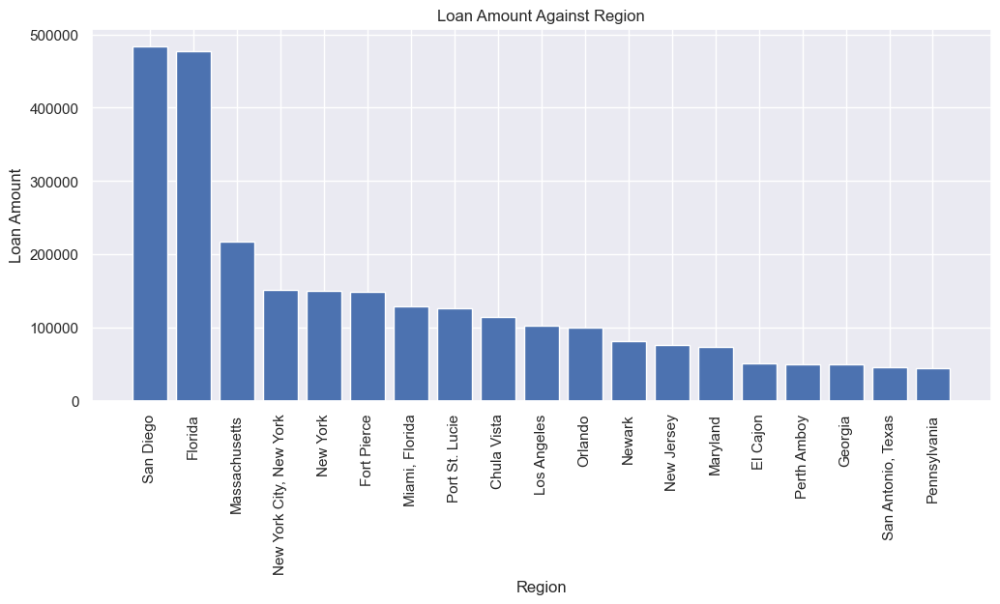

In [81]:
top_20 = region.head(20)

top_20 = top_20[top_20['region'] != 'Unknown_Region']

plt.figure(figsize=(12,5))

plt.bar(top_20['region'],top_20['loan_amount']) # plt.bar(x,height)

plt.xticks(rotation=90)
plt.xlabel('Region')
plt.ylabel('Loan Amount')
plt.title('Loan Amount Against Region')

<BarContainer object of 19 artists>

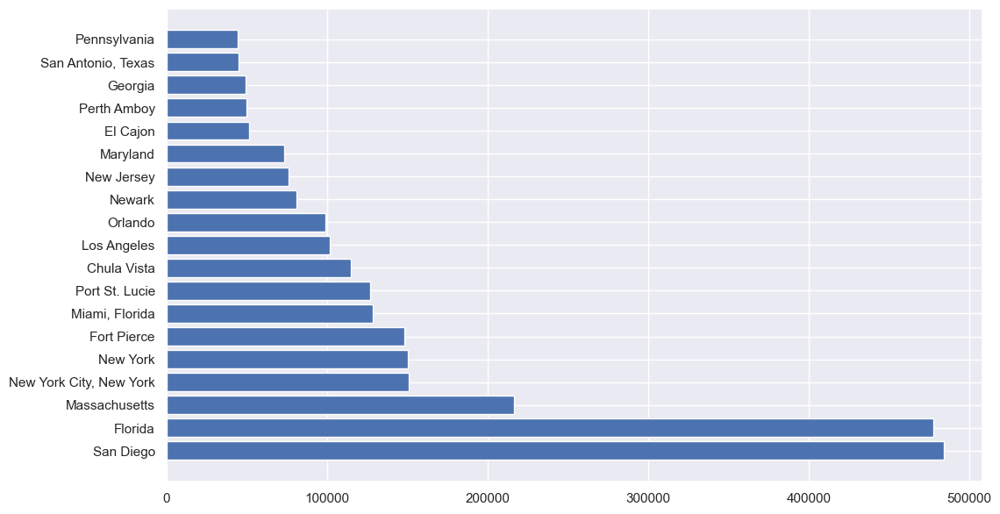

In [82]:
plt.figure(figsize=(12,7))

plt.barh(top_20['region'],top_20['loan_amount']) 

###  Scatter Plot

Text(0.5, 1.0, 'Funded Amount x Lender Count')

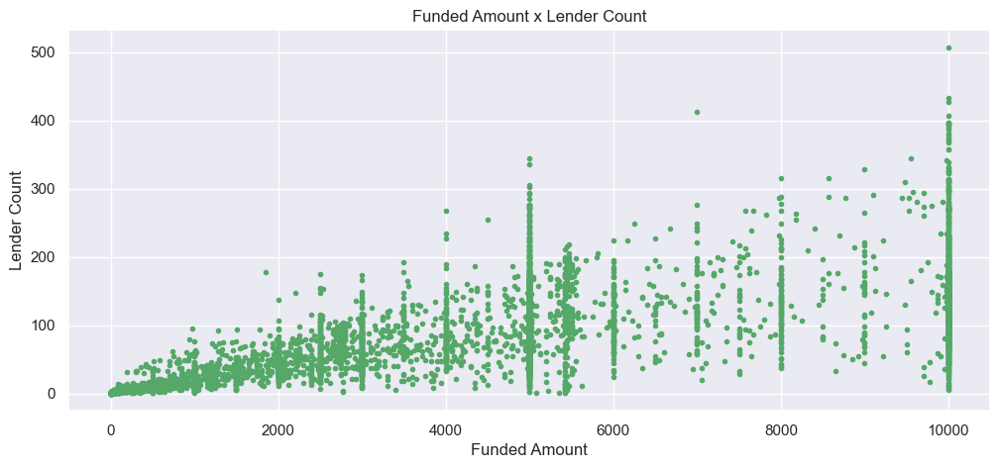

In [83]:
plt.figure(figsize=(12,5))

plt.scatter(usa['funded_amount'],usa['lender_count'],c='g',marker='.') # plt.scatter(x,y)

plt.xlabel('Funded Amount')
plt.ylabel('Lender Count')
plt.title('Funded Amount x Lender Count')

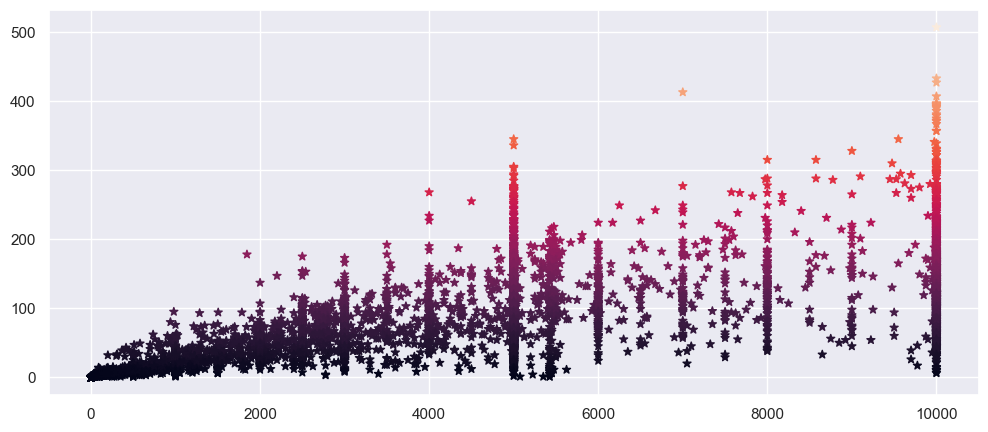

In [84]:
plt.figure(figsize=(12,5))

plt.scatter(usa['funded_amount'],usa['lender_count'], c=usa['lender_count'], marker='*') # plt.scatter(x,y)

### Histogram

(array([ 634.,  504.,  814.,  266., 1815.,  432.,  132.,  187.,   82.,
        1227.]),
 array([  125. ,  1112.5,  2100. ,  3087.5,  4075. ,  5062.5,  6050. ,
         7037.5,  8025. ,  9012.5, 10000. ]),
 <BarContainer object of 10 artists>)

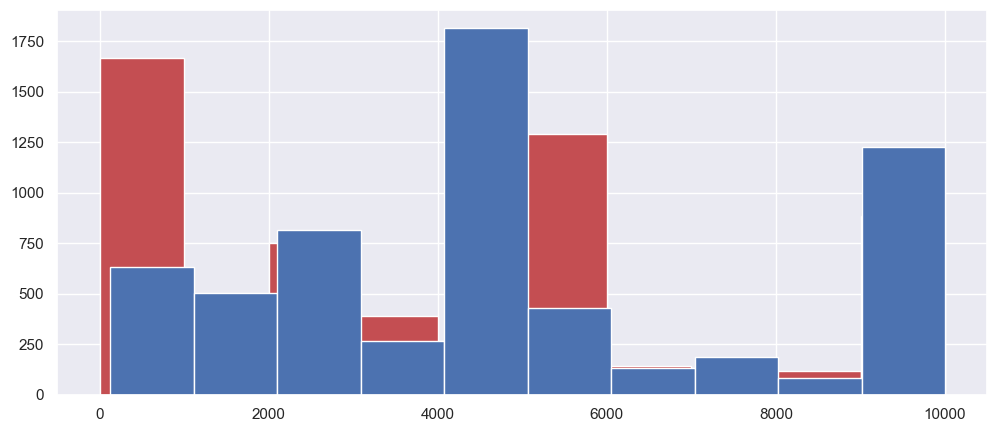

In [85]:
plt.figure(figsize=(12,5))

plt.hist(usa['funded_amount'],color='r')
plt.hist(usa['loan_amount'],color='b')

### Pie Chart

In [86]:
sector = usa.groupby('sector')['funded_amount'].sum().sort_values(ascending= False).reset_index()

sector.head()

,sector,funded_amount
0,Services,6311925.0
1,Food,5850715.0
2,Retail,2999520.0
3,Agriculture,2566375.0
4,Clothing,1393120.0


In [87]:
sector['sector'].unique()

array(['Services', 'Food', 'Retail', 'Agriculture', 'Clothing', 'Arts',
       'Education', 'Personal Use', 'Transportation', 'Entertainment',
       'Health', 'Construction', 'Housing', 'Manufacturing', 'Wholesale'],
      dtype=object)

In [88]:
sector['sector'].nunique()

15

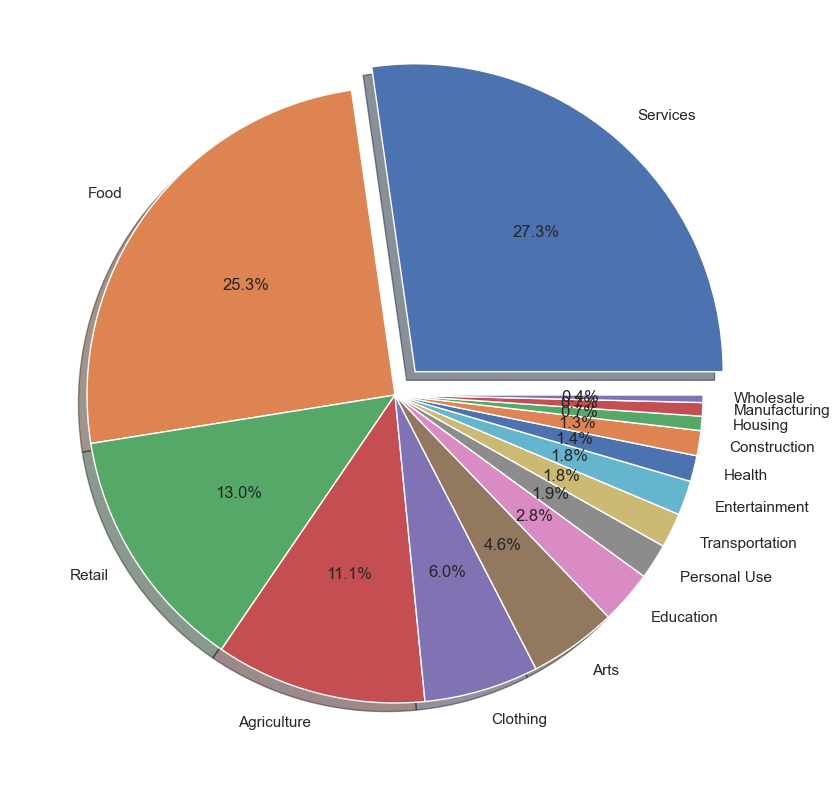

In [89]:
explode = (0.1, 0, 0, 0,0,0,0,0,0,0,0,0,0,0,0)  # only "explode" the 1st slice (i.e. 'Service')

plt.figure(figsize=(10,10))

plt.pie(sector['funded_amount'],labels=sector['sector'], explode = explode,shadow=True,autopct='%1.1f%%')

plt.show()

### Line Plot

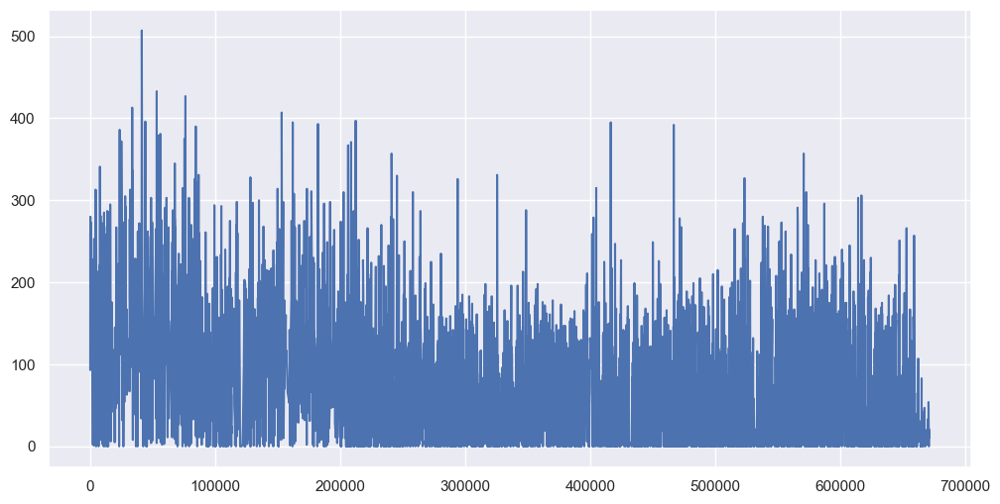

In [90]:
plt.figure(figsize=(12,6))

plt.plot(usa['lender_count'])

### Matplotlib Subplots

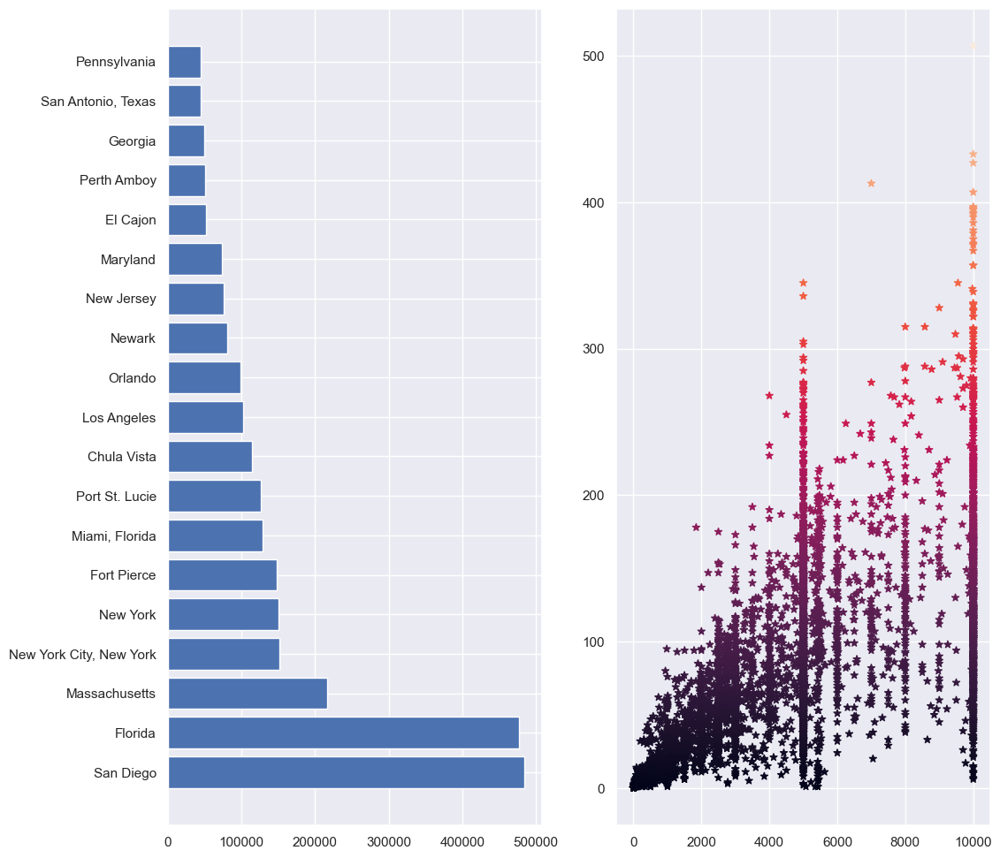

In [91]:
plt.figure(figsize=(12,12))

plt.subplot(1,2,1) # plt.subplot(nrows, ncols, plot_number)

plt.barh(top_20['region'],top_20['loan_amount']) # plt.bar(x,height)

plt.subplot(1,2,2)

plt.scatter(usa['funded_amount'],usa['lender_count'],c=usa['lender_count'],marker='*')  # plt.scatter(x,y)

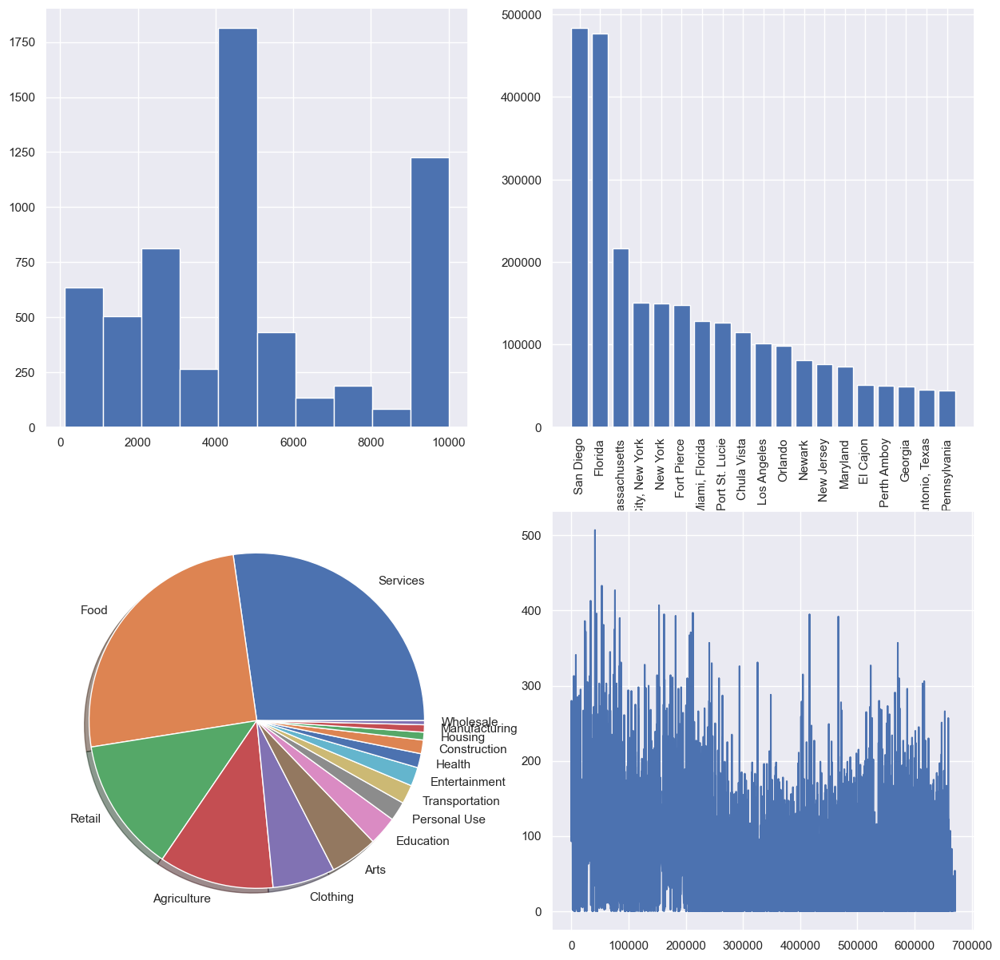

In [92]:
plt.figure(figsize=(15,15))

plt.subplot(2,2,1)  # plt.subplot(nrows, ncols, plot_number)
plt.hist(usa['loan_amount'],color='b')

plt.subplot(2,2,2)
plt.xticks(rotation=90) # Get or set the current tick locations and labels of the x-axis
plt.bar(top_20['region'],top_20['loan_amount']) # plt.bar(x,height)



plt.subplot(2,2,3)
plt.pie(sector['funded_amount'],labels=sector['sector'],shadow=True)

plt.subplot(2,2,4)
plt.plot(usa['lender_count'])

Data source: https://www.kaggle.com/kiva/data-science-for-good-kiva-crowdfunding

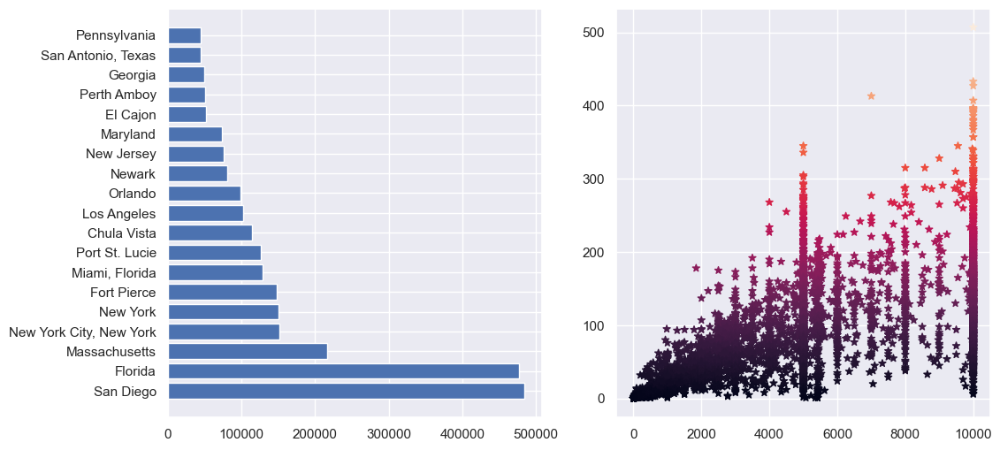

In [93]:
#Creates two subplots and unpack them. Create a figure and a set of subplots.

fig, ax = plt.subplots(1,2, figsize = (12,6)) # ax is a matplotlib axes

ax[0].barh(top_20['region'],top_20['loan_amount']) # plt.bar(x,height)

ax[1].scatter(usa['funded_amount'],usa['lender_count'], c=usa['lender_count'],marker='*') # plt.scatter(x,y)

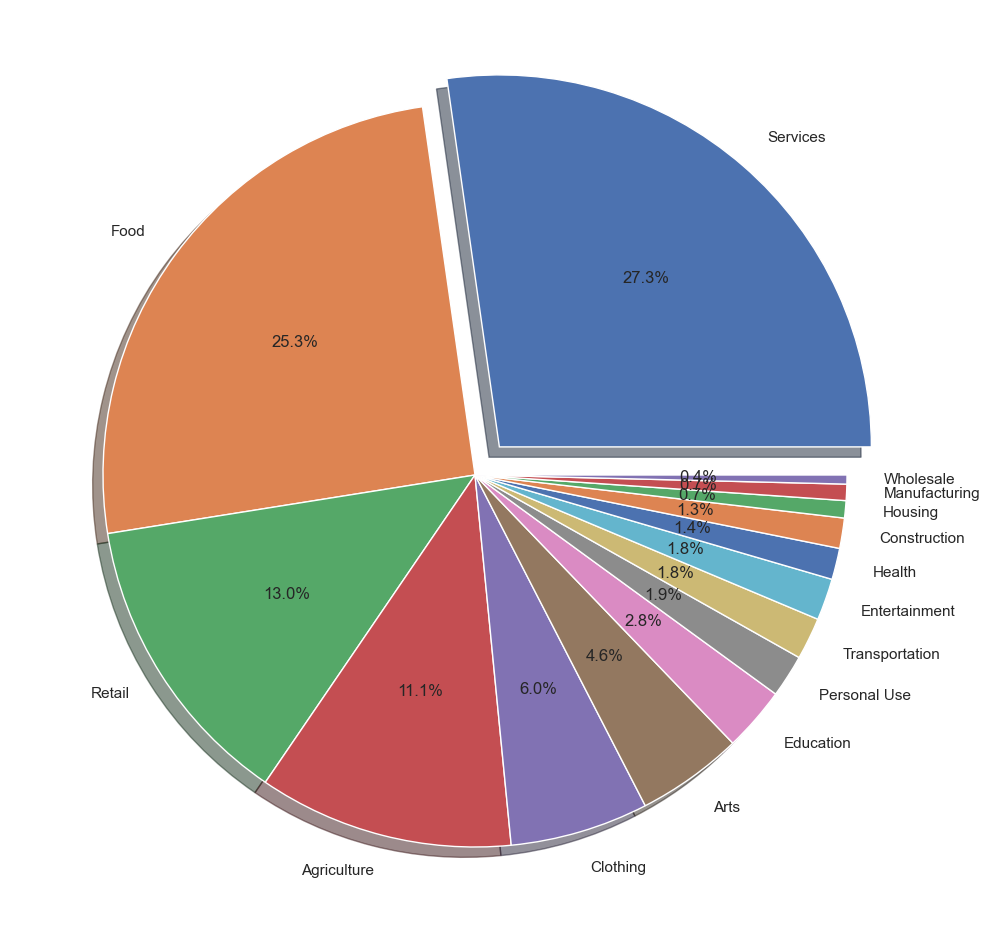

In [94]:
fig1, ax1 = plt.subplots(figsize = (12,15))

ax1.pie(sector['funded_amount'],labels=sector['sector'],explode = explode,shadow=True,autopct='%1.1f%%')

plt.show()

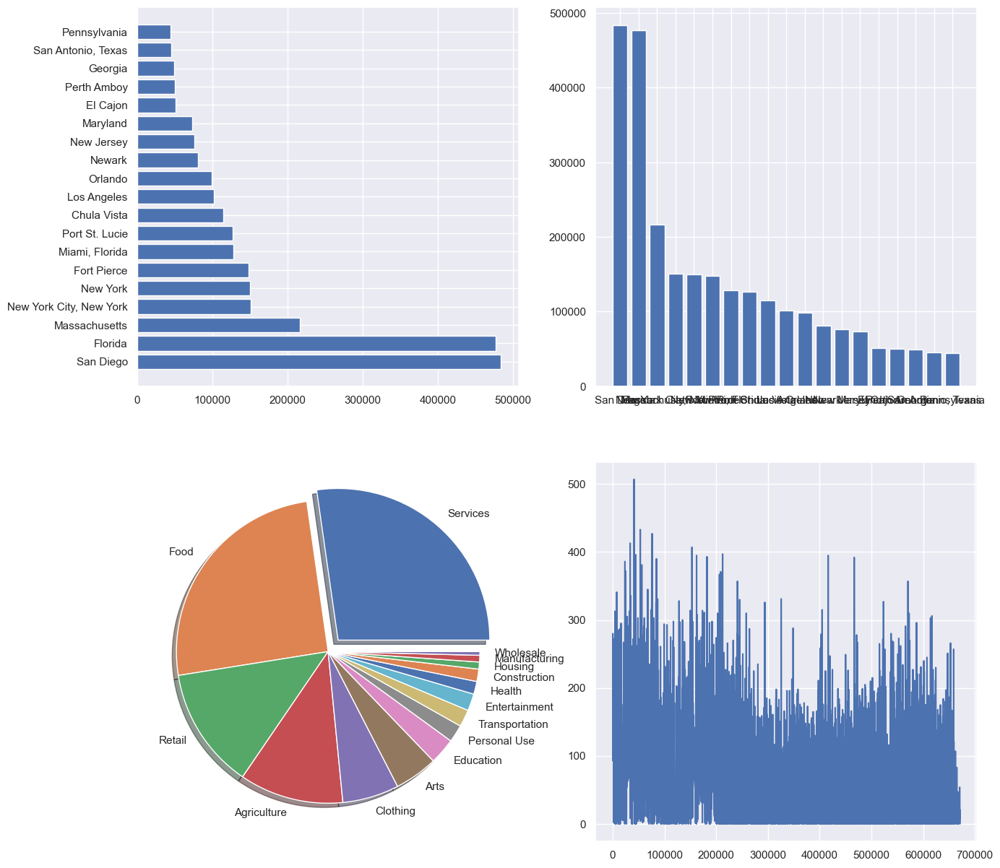

In [95]:
fig2, ax2 = plt.subplots(2,2,figsize = (15,15))

ax2[0,0].barh(top_20['region'],top_20['loan_amount']) # plt.bar(x,height)

ax2[0,1].bar(top_20['region'],top_20['loan_amount']) # plt.bar(x,height)

ax2[1,0].pie(sector['funded_amount'],labels=sector['sector'],explode = explode,shadow=True)

ax2[1,1].plot(usa['lender_count'])

### Categorical Plots

<Axes: title={'center': 'Sector Countplot'}, xlabel='sector', ylabel='count'>

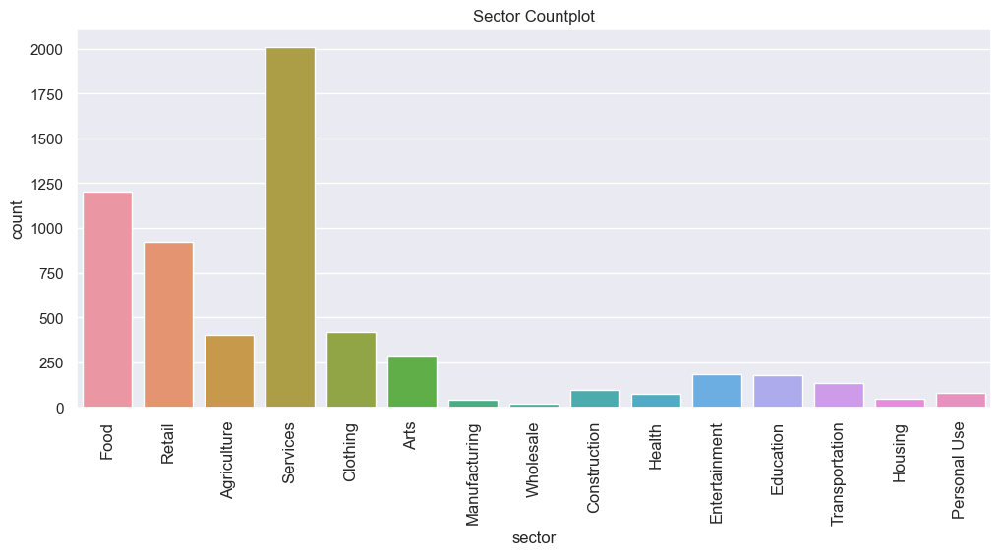

In [96]:
plt.figure(figsize=(12,5))          # Create a new figure

plt.title('Sector Countplot')
plt.xticks(rotation=90, fontsize=12)

sns.countplot(x='sector',data=usa)  # Show the counts of observations in each categorical bin using bars.

### Violin Plot

<Axes: title={'center': 'Sector VS Funded Amount Violinplot'}, xlabel='sector', ylabel='funded_amount'>

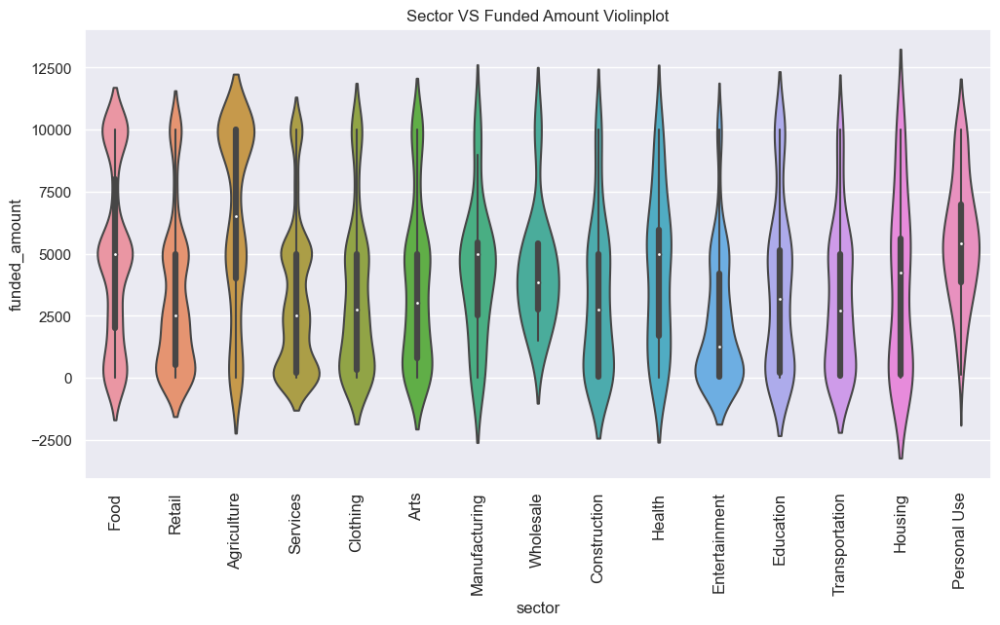

In [97]:
plt.figure(figsize=(12,6))         # Create a new figure

plt.title('Sector VS Funded Amount Violinplot')
plt.xticks(rotation=90, fontsize=12)

sns.violinplot(x='sector', y='funded_amount', data=usa)

<Axes: xlabel='sector', ylabel='lender_count'>

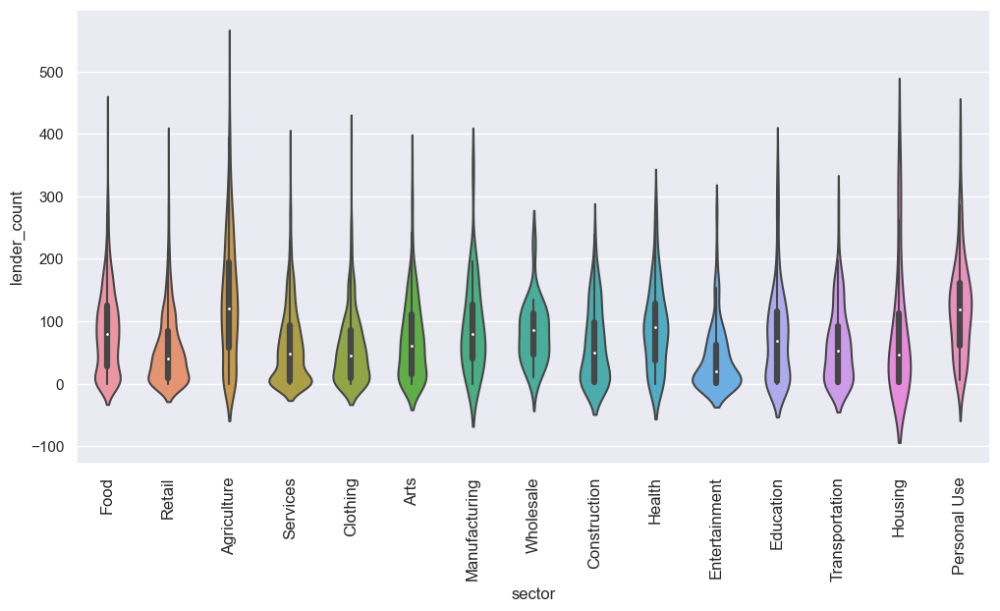

In [98]:
plt.figure(figsize=(12,6))         # Create a new figure

plt.xticks(rotation=90, fontsize=12)

sns.violinplot(x='sector', y='lender_count',data=usa)

### Swarm Plot

<Axes: title={'center': 'Sector VS Lender Count Swarmplot'}, xlabel='sector', ylabel='lender_count'>

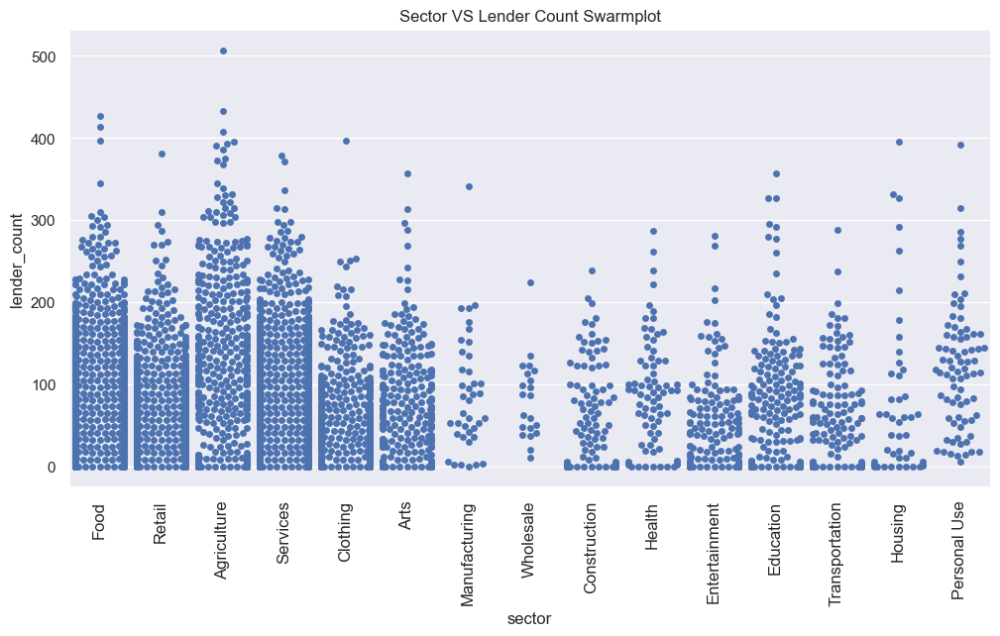

In [99]:
plt.figure(figsize=(12,6))         # Create a new figure

plt.xticks(rotation=90,fontsize=12)
plt.title('Sector VS Lender Count Swarmplot')

sns.swarmplot(x='sector',y='lender_count',data=usa)

### Strip plot

<Axes: xlabel='sector', ylabel='lender_count'>

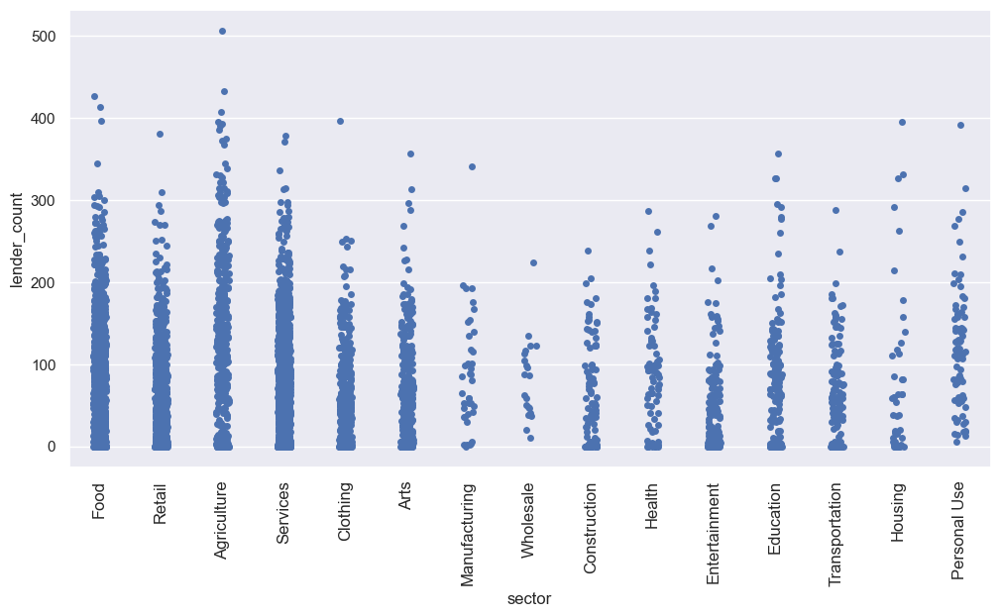

In [100]:
plt.figure(figsize=(12,6))          # Create a new figure

plt.xticks(rotation=90,fontsize=12)

sns.stripplot(x='sector', y='lender_count', data=usa) # another type of a scatterplot

### Adding Hue

<Axes: title={'center': 'Sector VS Lender Count Swarmplot'}, xlabel='sector', ylabel='lender_count'>

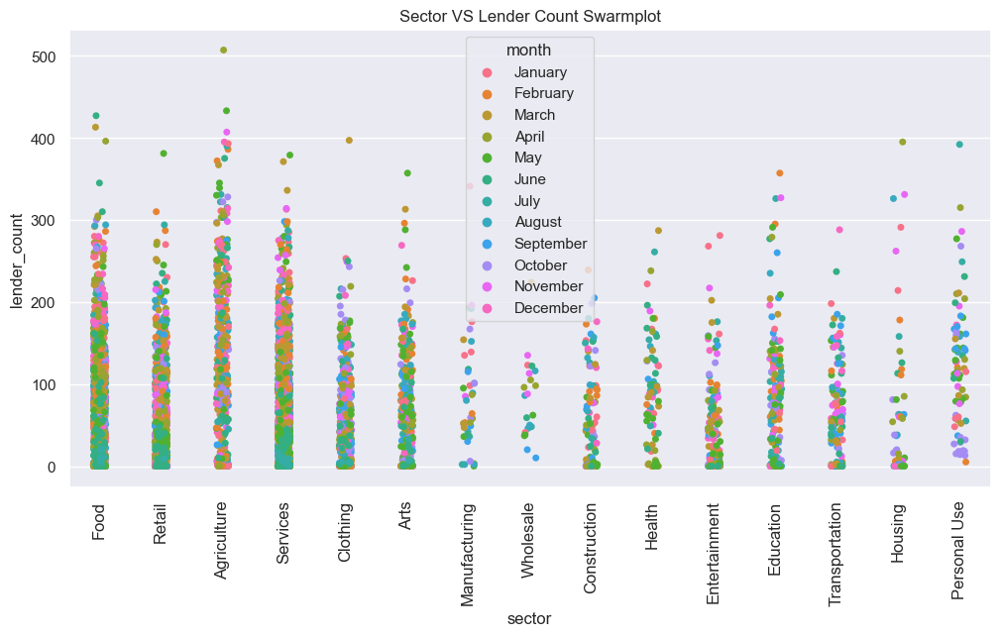

In [101]:
# Hue for showing more than one relationship

plt.figure(figsize=(12,6))       # Create a new figure

plt.xticks(rotation=90,fontsize=12)
plt.title('Sector VS Lender Count Swarmplot')

sns.stripplot(x='sector', y='lender_count', hue='month', data=usa)

### Box Plot

<Axes: xlabel='sector', ylabel='funded_amount'>

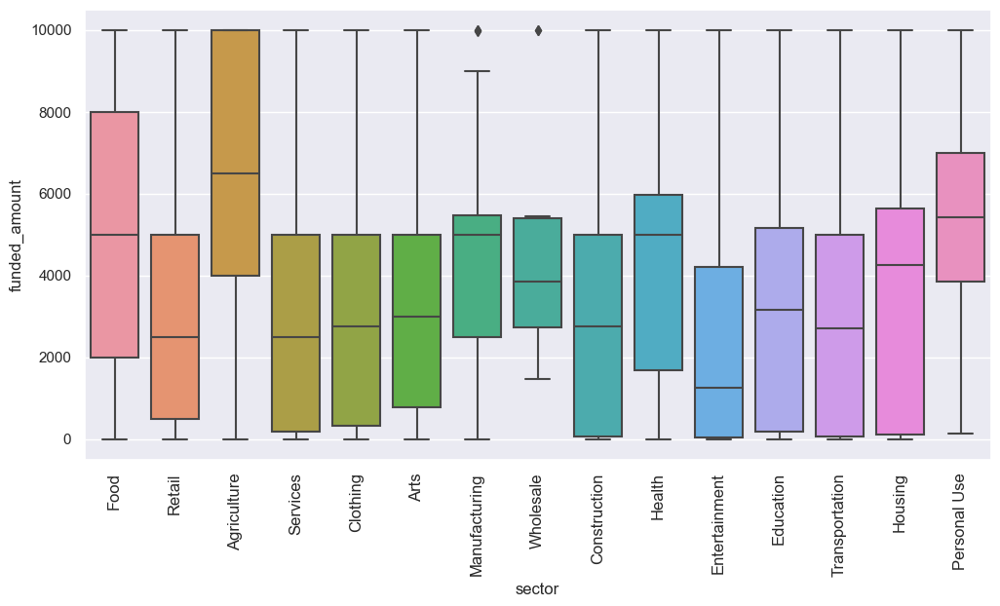

In [102]:
# Distribution of funded amount within sectors

plt.figure(figsize=(12,6)) 

plt.xticks(rotation=90,fontsize=12)

sns.boxplot(x="sector", y="funded_amount", data=usa)

### Boxen Plot

<Axes: xlabel='sector', ylabel='funded_amount'>

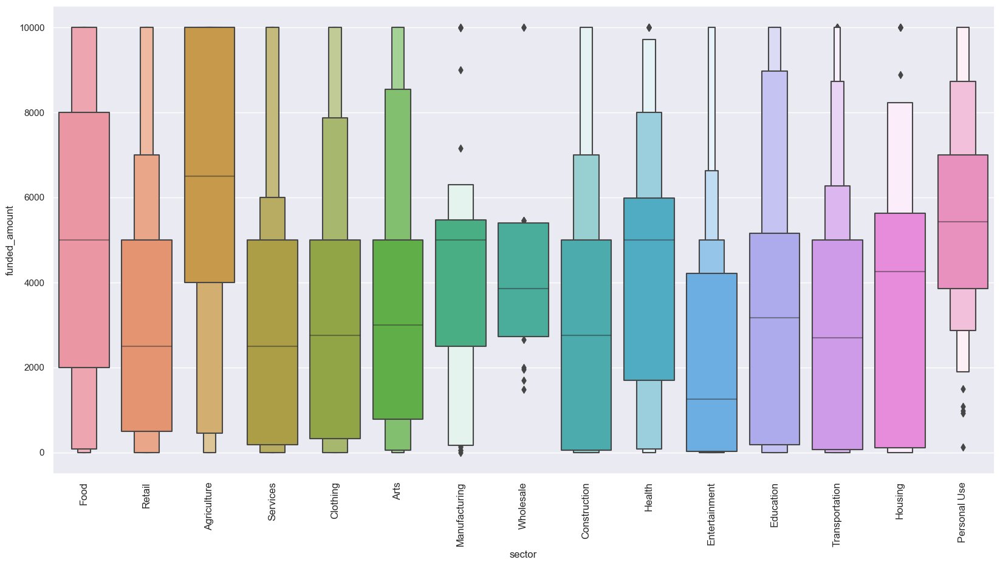

In [103]:
# Distribution of funded amount within sectors

plt.figure(figsize=(20,10)) 

plt.xticks(rotation=90,fontsize=12)

sns.boxenplot(x="sector", y="funded_amount", data=usa)

### Bar Plot

Text(0.5, 1.0, 'Loan Amount Against Region')

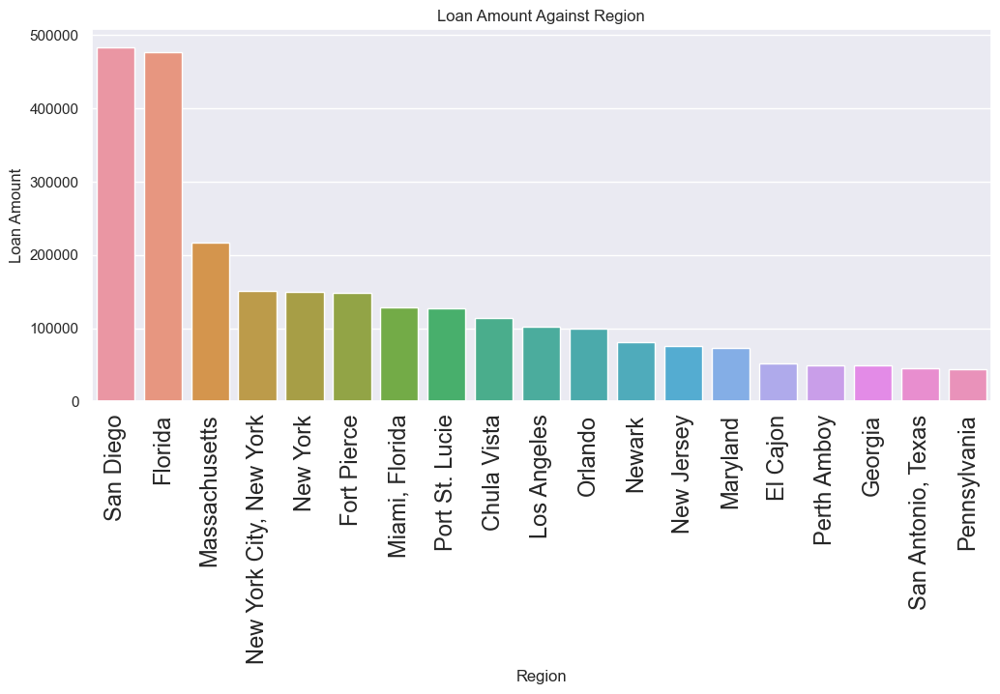

In [104]:
plt.figure(figsize=(12,5)) 

plt.xticks(rotation=90,fontsize=17)

sns.barplot(x='region',y='loan_amount', data=top_20)

plt.xlabel('Region')
plt.ylabel('Loan Amount')
plt.title('Loan Amount Against Region')

<Axes: xlabel='loan_amount', ylabel='region'>

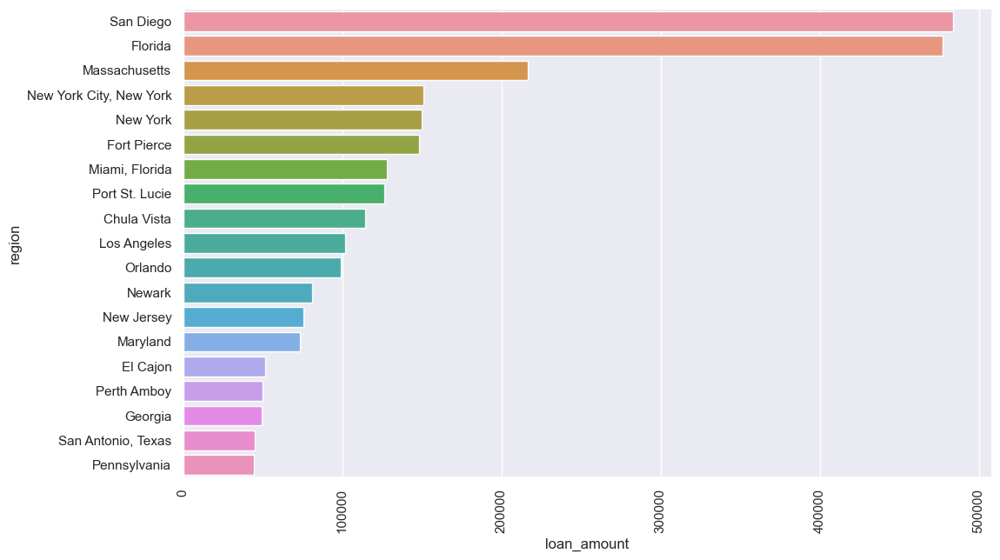

In [105]:
plt.figure(figsize=(12,7)) 

plt.xticks(rotation=90) 
                        
sns.barplot(y='region',x='loan_amount', data=top_20)

### Visualizing Distributions

<Axes: xlabel='funded_amount', ylabel='lender_count'>

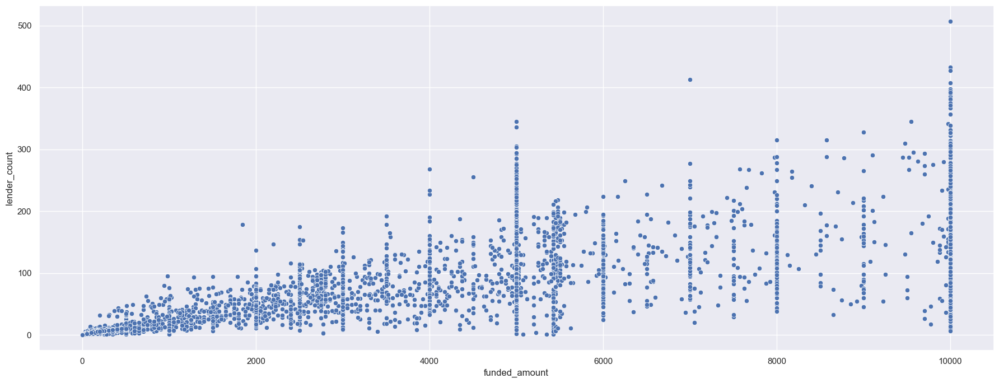

In [106]:
plt.figure(figsize=(22,8))

sns.scatterplot(x='funded_amount',y='lender_count',data=usa)

<Axes: xlabel='funded_amount', ylabel='lender_count'>

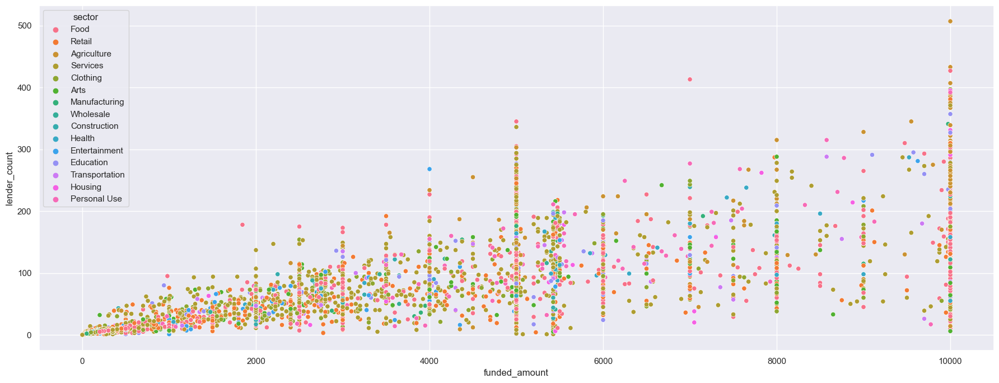

In [107]:
plt.figure(figsize=(22,8))

sns.scatterplot(x='funded_amount',y='lender_count',hue='sector',data=usa)

# hue : name of variables in ``data`` 
#     Grouping variable that will produce points with different colors.
#     Can be either categorical or numeric, although color mapping will
#     behave differently in latter case.

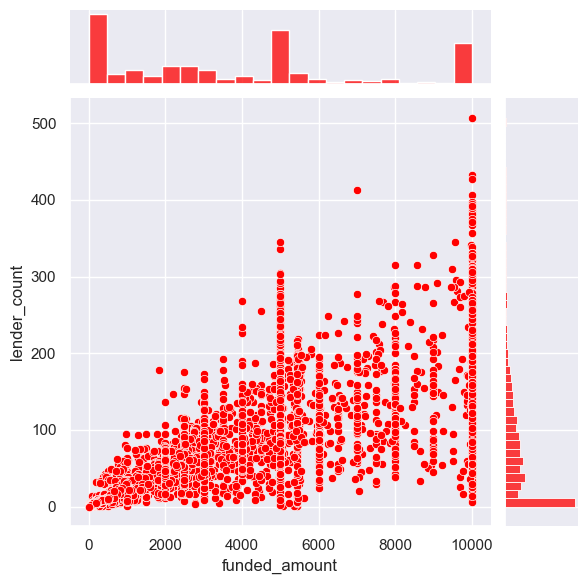

In [108]:
sns.jointplot(x='funded_amount',y='lender_count',color='red',data=usa)

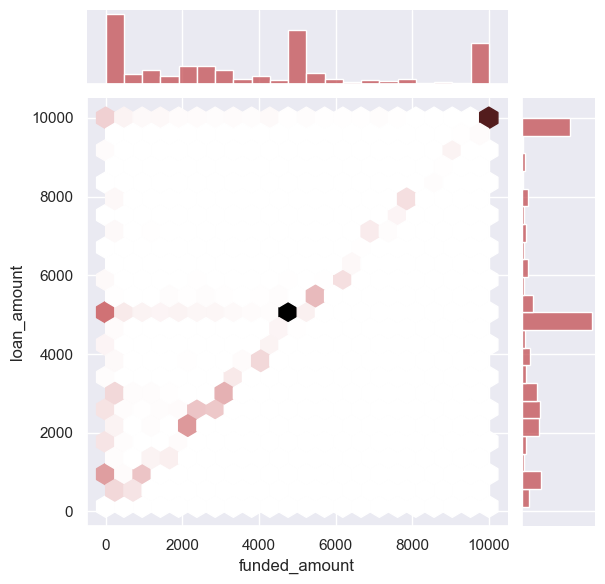

In [109]:
sns.jointplot(x='funded_amount',y='loan_amount',kind='hex',color='r',data=usa)

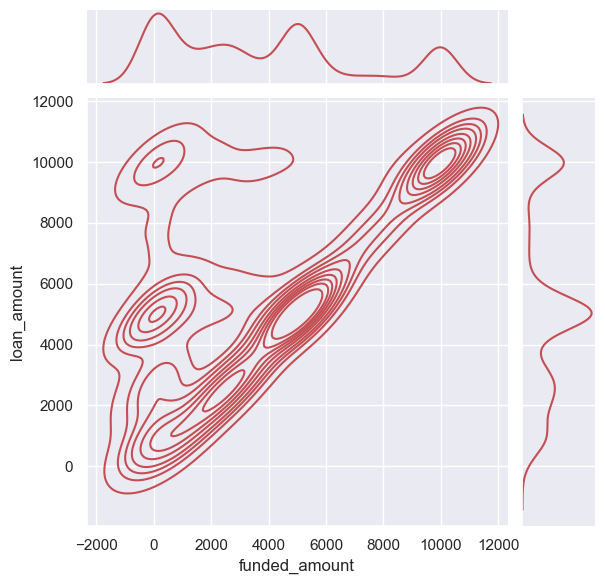

In [110]:
sns.jointplot(x='funded_amount',y='loan_amount',kind='kde',color='r', data=usa)

<Axes: xlabel='funded_amount', ylabel='Count'>

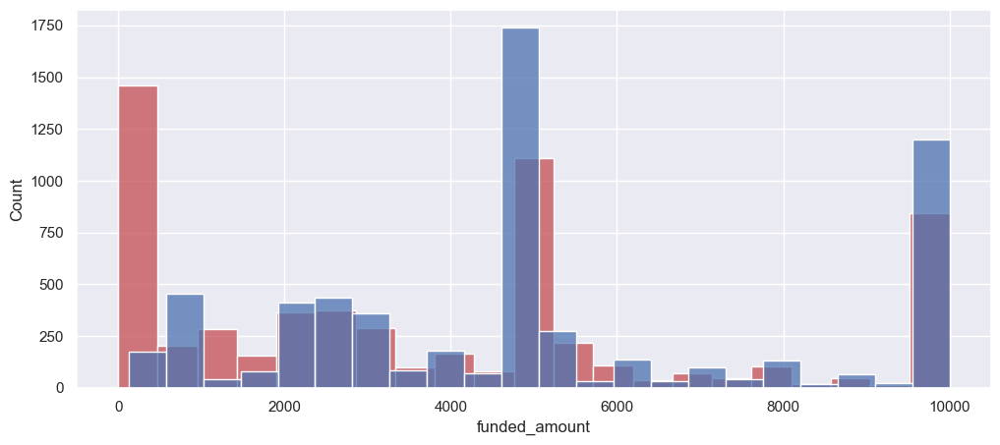

In [111]:
plt.figure(figsize=(12,5))

sns.histplot(usa['funded_amount'],color='r')
sns.histplot(usa['loan_amount'],color='b')

### Pairplot

<Figure size 1200x500 with 0 Axes>

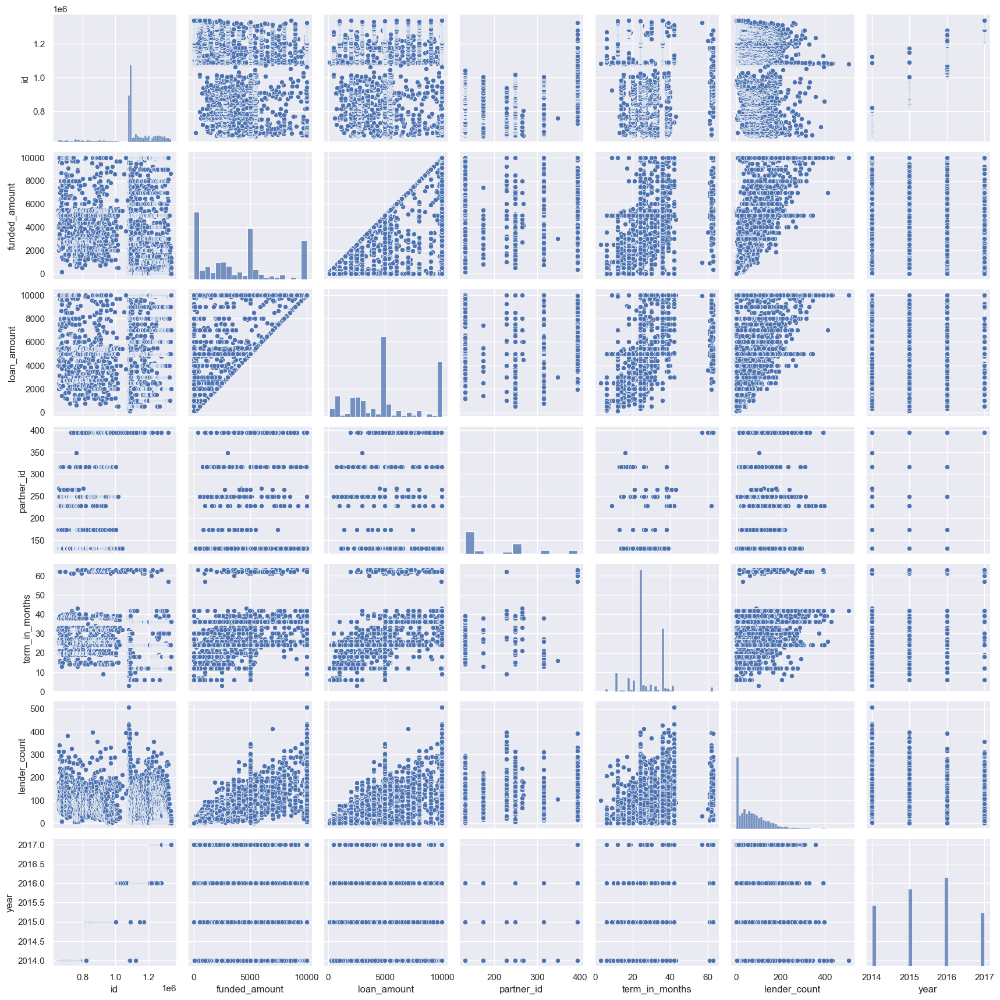

In [112]:
plt.figure(figsize=(12,5))

sns.pairplot(usa)

<Figure size 1200x500 with 0 Axes>

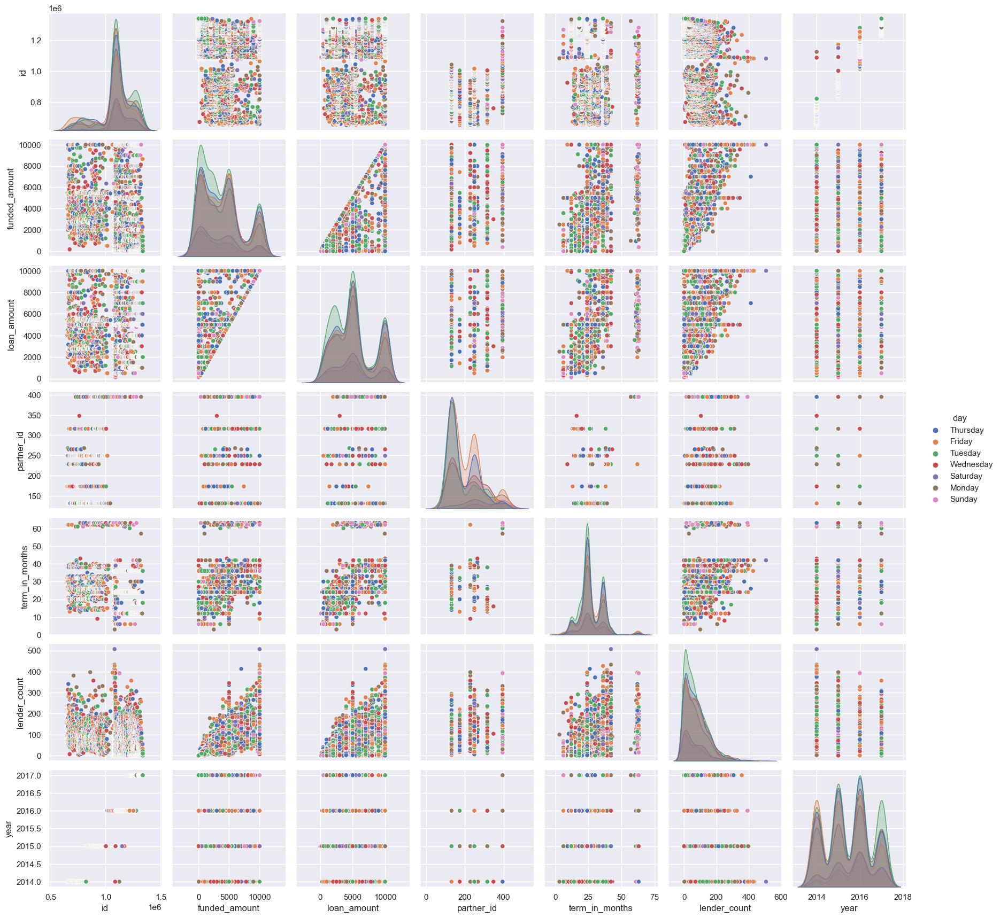

In [113]:
plt.figure(figsize=(12,5))

sns.pairplot(usa, hue="day")

### Line Plot

<Axes: xlabel='funded_amount', ylabel='lender_count'>

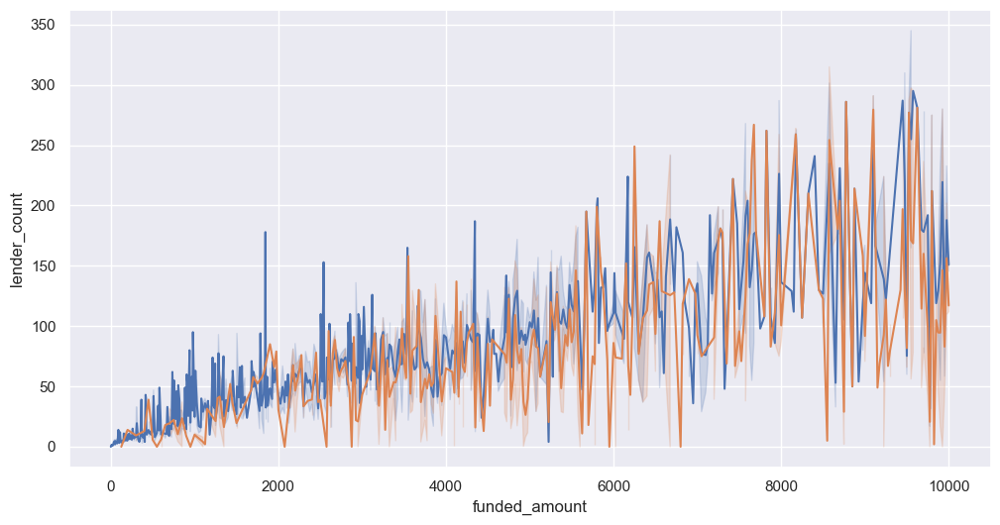

In [114]:
plt.figure(figsize=(12,6))

sns.lineplot(x='funded_amount',y='lender_count',data=usa)
sns.lineplot(x='loan_amount',y='lender_count',data=usa)

## Matplotlib Subplots with Seaborn Section

<Axes: xlabel='funded_amount', ylabel='lender_count'>

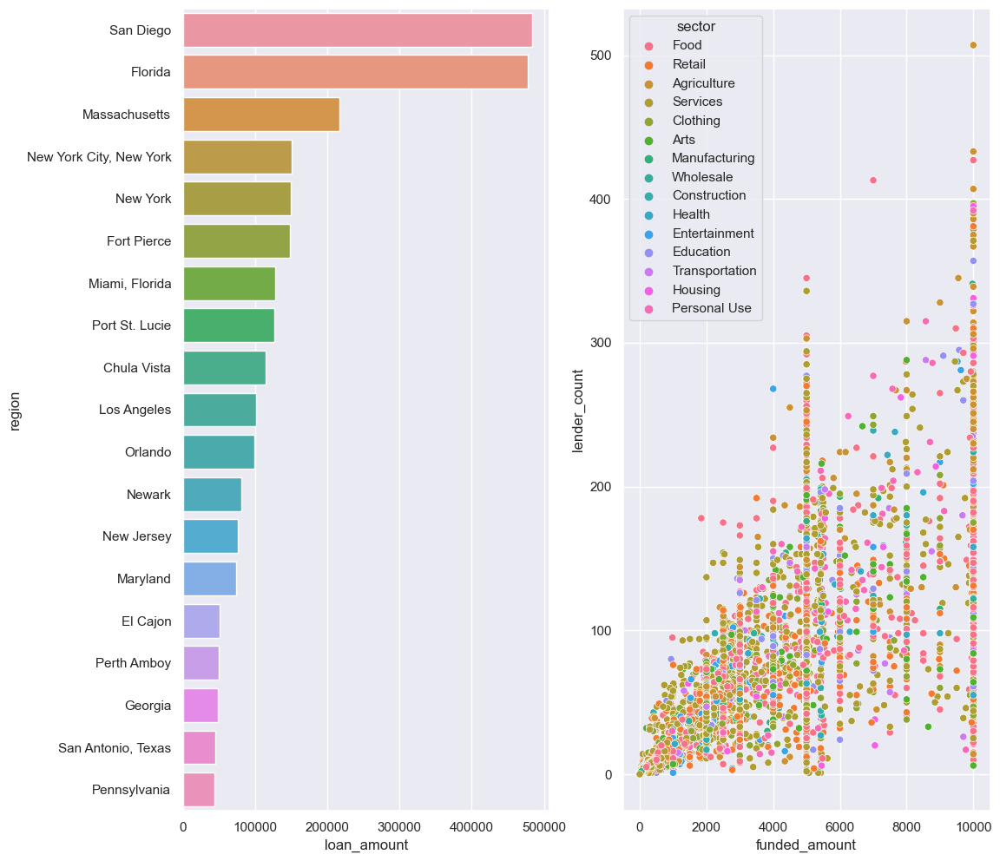

In [115]:
# plt.subplot(nrows, ncols, plot_number)

plt.figure(figsize=(12,12))

plt.subplot(1,2,1)
sns.barplot(y='region',x='loan_amount', data=top_20)

plt.subplot(1,2,2)
sns.scatterplot(x='funded_amount',y='lender_count',hue='sector',data=usa)

<Axes: xlabel='loan_amount', ylabel='lender_count'>

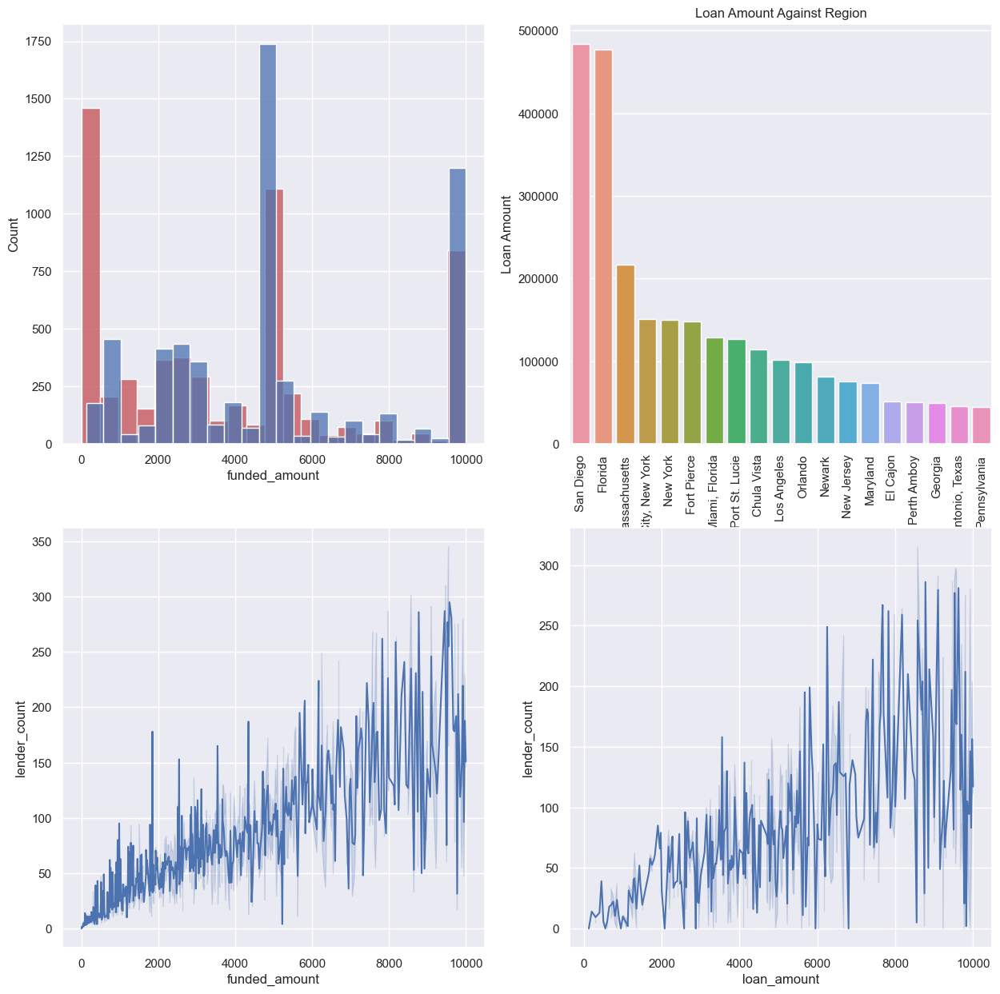

In [116]:
# plt.subplot(nrows, ncols, plot_number)

plt.figure(figsize=(15,15))

plt.subplot(2,2,1)
sns.histplot(usa['funded_amount'],color='r')
sns.histplot(usa['loan_amount'],color='b')

plt.subplot(2,2,2)
plt.xticks(rotation=90) # Get or set the current tick locations and labels of the x-axis
sns.barplot(x='region',y='loan_amount', data=top_20)
plt.xlabel('Region')
plt.ylabel('Loan Amount')
plt.title('Loan Amount Against Region')

plt.subplot(2,2,3)
sns.lineplot(x='funded_amount',y='lender_count',data=usa)

plt.subplot(2,2,4)
sns.lineplot(x='loan_amount',y='lender_count',data=usa)

<Axes: xlabel='funded_amount', ylabel='lender_count'>

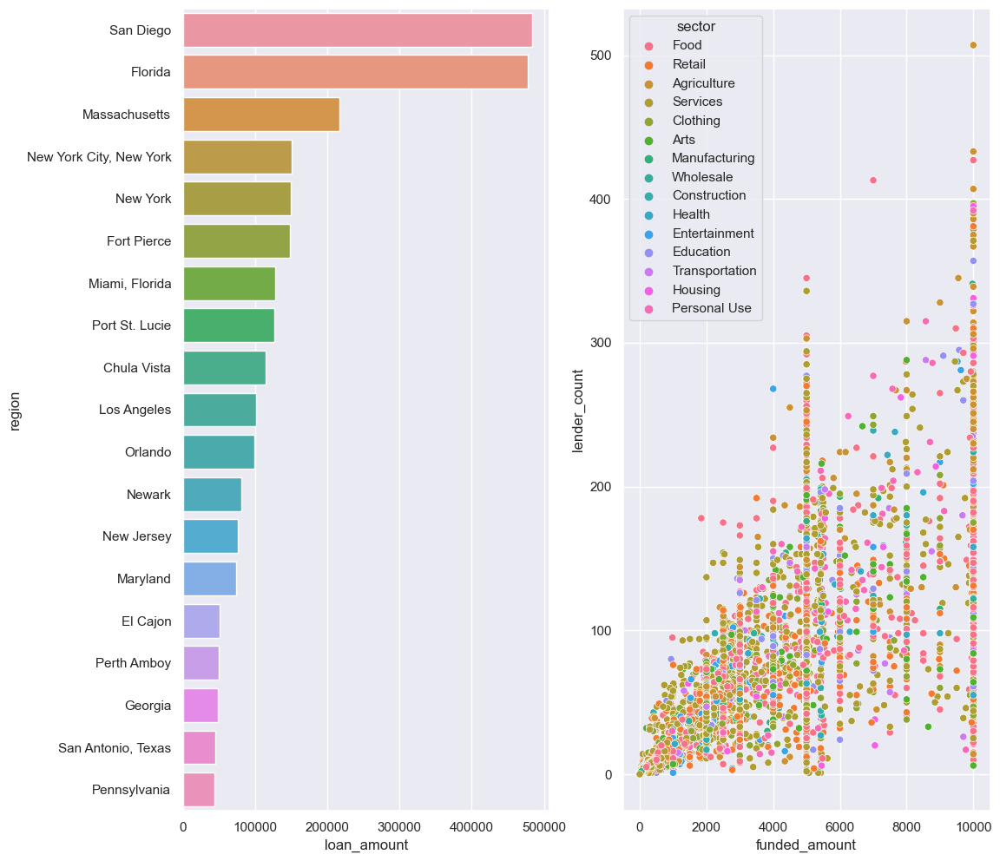

In [117]:
# plt.subplot(nrows, ncols, plot_number)

plt.figure(figsize=(12,12))

plt.subplot(1,2,1)
sns.barplot(y='region',x='loan_amount', data=top_20)

plt.subplot(1,2,2)
sns.scatterplot(x='funded_amount',y='lender_count',hue='sector',data=usa)

<Axes: xlabel='funded_amount', ylabel='lender_count'>

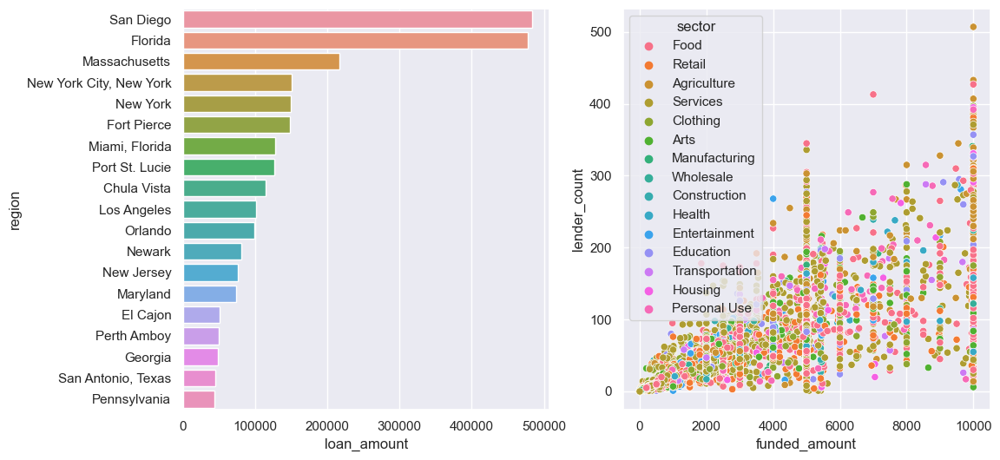

In [118]:
fig, ax = plt.subplots(1,2, figsize = (12,6))

sns.barplot(y='region',x='loan_amount', data=top_20, ax=ax[0])
sns.scatterplot(x='funded_amount',y='lender_count',hue='sector',data=usa,ax=ax[1])

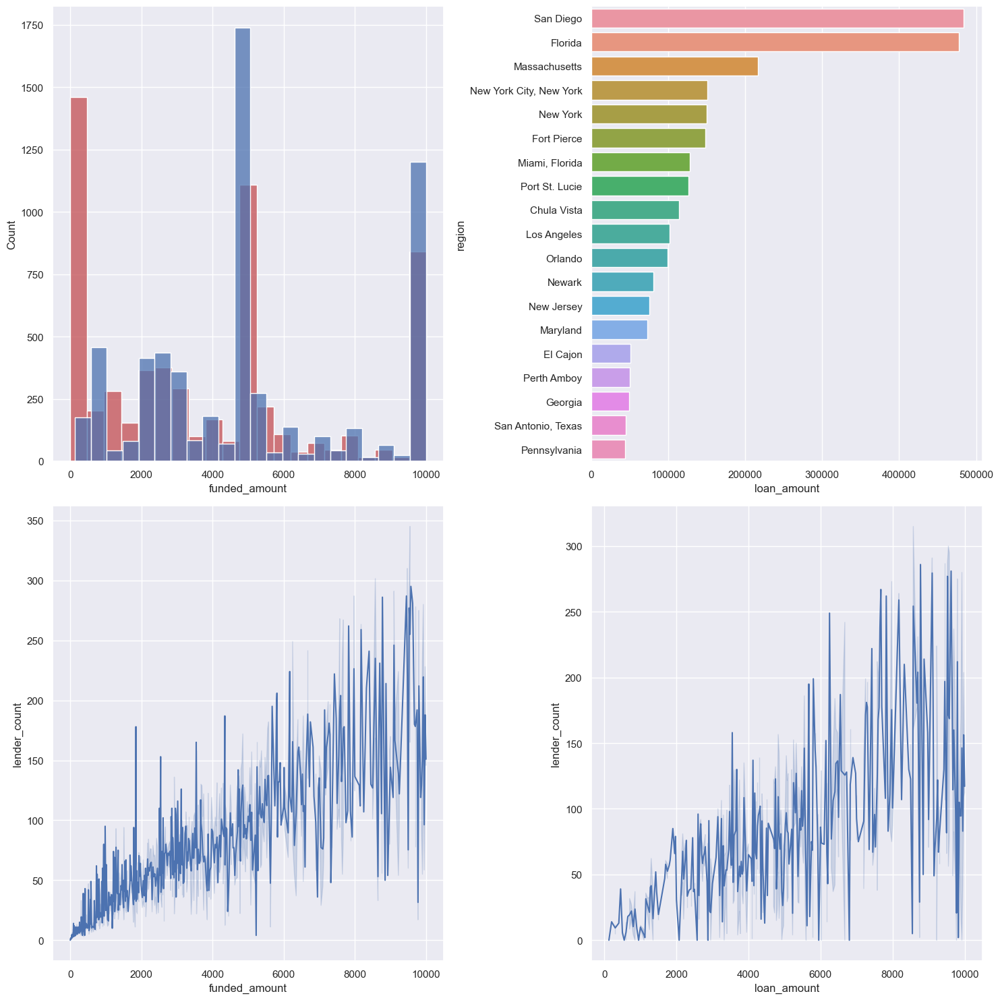

In [119]:
# plt.subplot(nrows, ncols, plot_number)

fig1, ax1 = plt.subplots(2,2, figsize = (15,15))

sns.histplot(usa['funded_amount'],color='r',ax=ax1[0,0])
sns.histplot(usa['loan_amount'],color='b',ax=ax1[0,0])

sns.barplot(y='region',x='loan_amount', data=top_20,ax=ax1[0,1])

sns.lineplot(x='funded_amount',y='lender_count',data=usa,ax=ax1[1,0])

sns.lineplot(x='loan_amount',y='lender_count',data=usa,ax=ax1[1,1])

plt.tight_layout()

### Matrix Visualization

In [120]:
corr = usa.corr()
corr

,id,funded_amount,loan_amount,partner_id,term_in_months,lender_count,year
id,1.000000,-0.108620,-0.005849,0.400365,-0.071542,-0.220667,0.753130
funded_amount,-0.108620,1.000000,0.703399,0.195330,0.544649,0.752785,-0.076514
loan_amount,-0.005849,0.703399,1.000000,0.213743,0.710786,0.479729,0.011789
partner_id,0.400365,0.195330,0.213743,1.000000,0.645826,0.217364,0.345954
term_in_months,-0.071542,0.544649,0.710786,0.645826,1.000000,0.412119,0.008457
lender_count,-0.220667,0.752785,0.479729,0.217364,0.412119,1.000000,-0.261958
year,0.753130,-0.076514,0.011789,0.345954,0.008457,-0.261958,1.000000


In [121]:
corr.drop(['id','partner_id'], axis=0,inplace=True)
corr.drop(['id','partner_id'], axis=1,inplace=True)
corr

,funded_amount,loan_amount,term_in_months,lender_count,year
funded_amount,1.000000,0.703399,0.544649,0.752785,-0.076514
loan_amount,0.703399,1.000000,0.710786,0.479729,0.011789
term_in_months,0.544649,0.710786,1.000000,0.412119,0.008457
lender_count,0.752785,0.479729,0.412119,1.000000,-0.261958
year,-0.076514,0.011789,0.008457,-0.261958,1.000000


<Axes: >

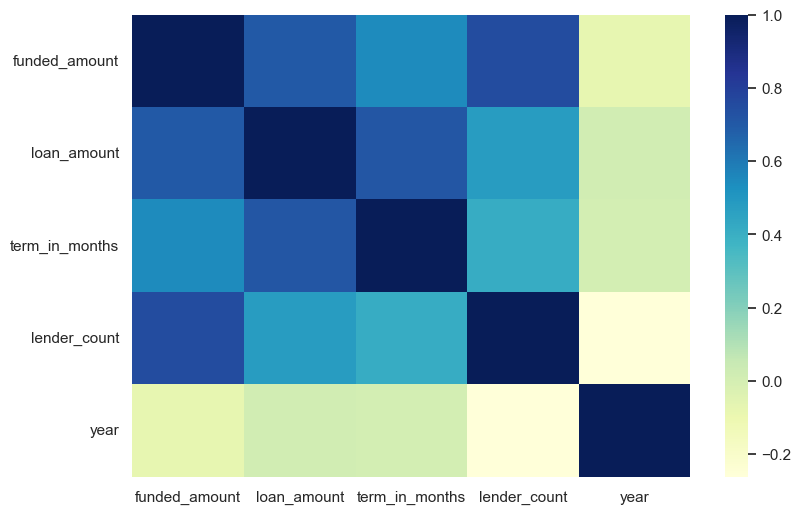

In [122]:
plt.figure(figsize=(9,6))
sns.heatmap(corr, cmap="YlGnBu")

<Axes: >

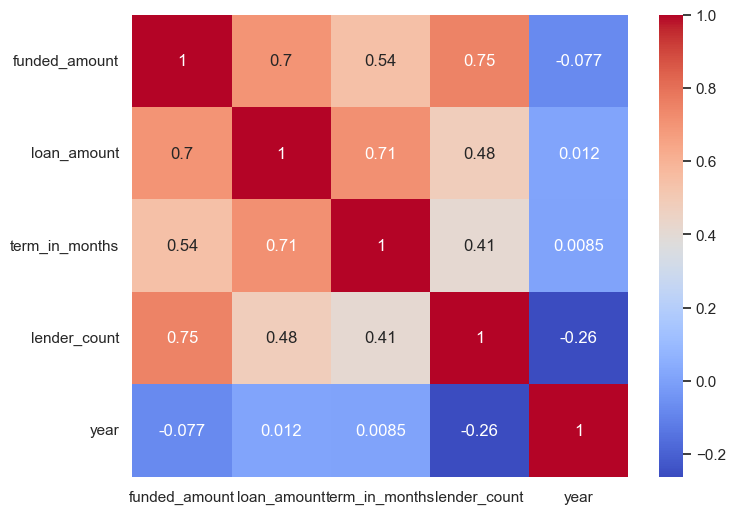

In [123]:
plt.figure(figsize=(8,6))
sns.heatmap(corr, cmap="coolwarm", annot=True)

### Visualize Linear Relationships

<Axes: title={'center': 'Funded Amount and Lender Count Regression Plot'}, xlabel='funded_amount', ylabel='lender_count'>

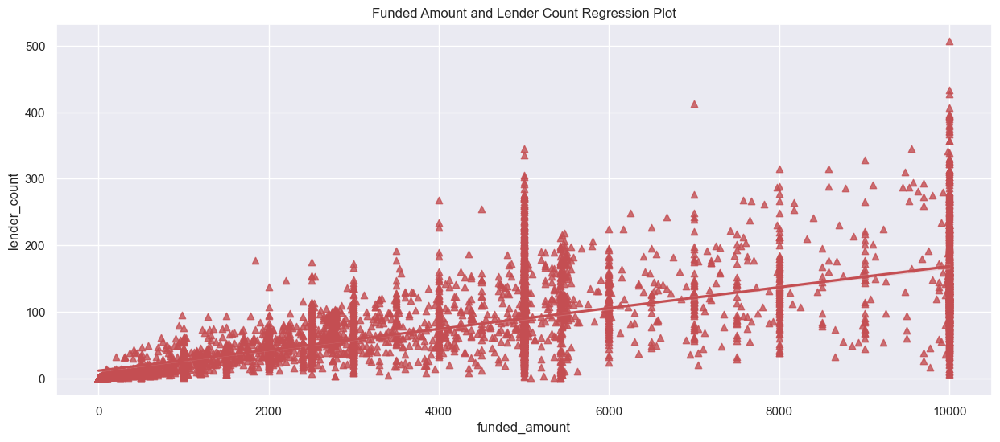

In [124]:
# Fits a linear regression line and plots the resulting line

plt.figure(figsize=(15,6))

plt.title('Funded Amount and Lender Count Regression Plot')
plt.xlabel('Funded Amount')
plt.ylabel('Lender Count')

sns.regplot(x="funded_amount", y="lender_count", data=usa, marker='^',color='r')

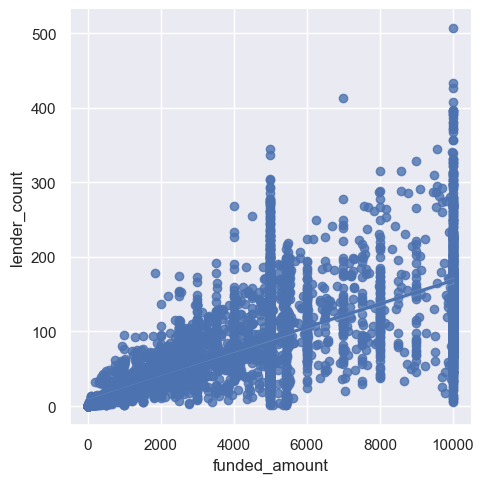

In [125]:
# Fits a regression line and plots the resulting line

sns.lmplot(x="funded_amount", y="lender_count", data=usa)

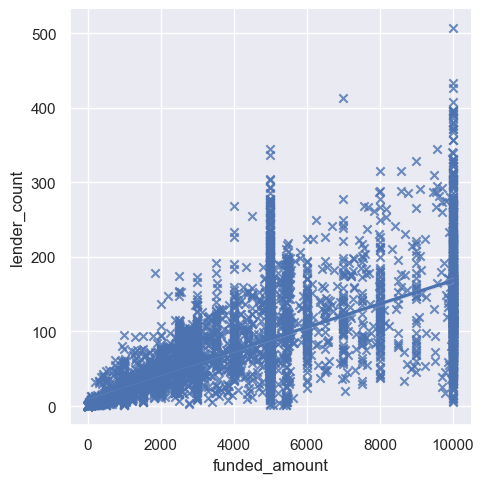

In [126]:
# Fits a regression line and plots the resulting line

sns.lmplot(x="funded_amount", markers=["x"],y="lender_count",data=usa)

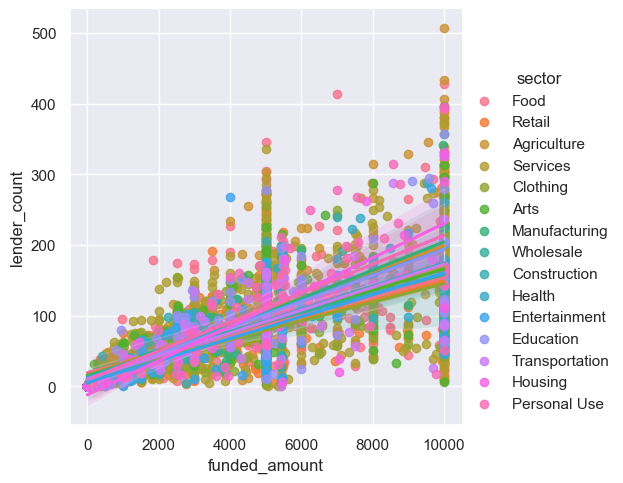

In [127]:
# Fits a regression line and plots the resulting line

sns.lmplot(x="funded_amount", y="lender_count",hue='sector',data=usa)

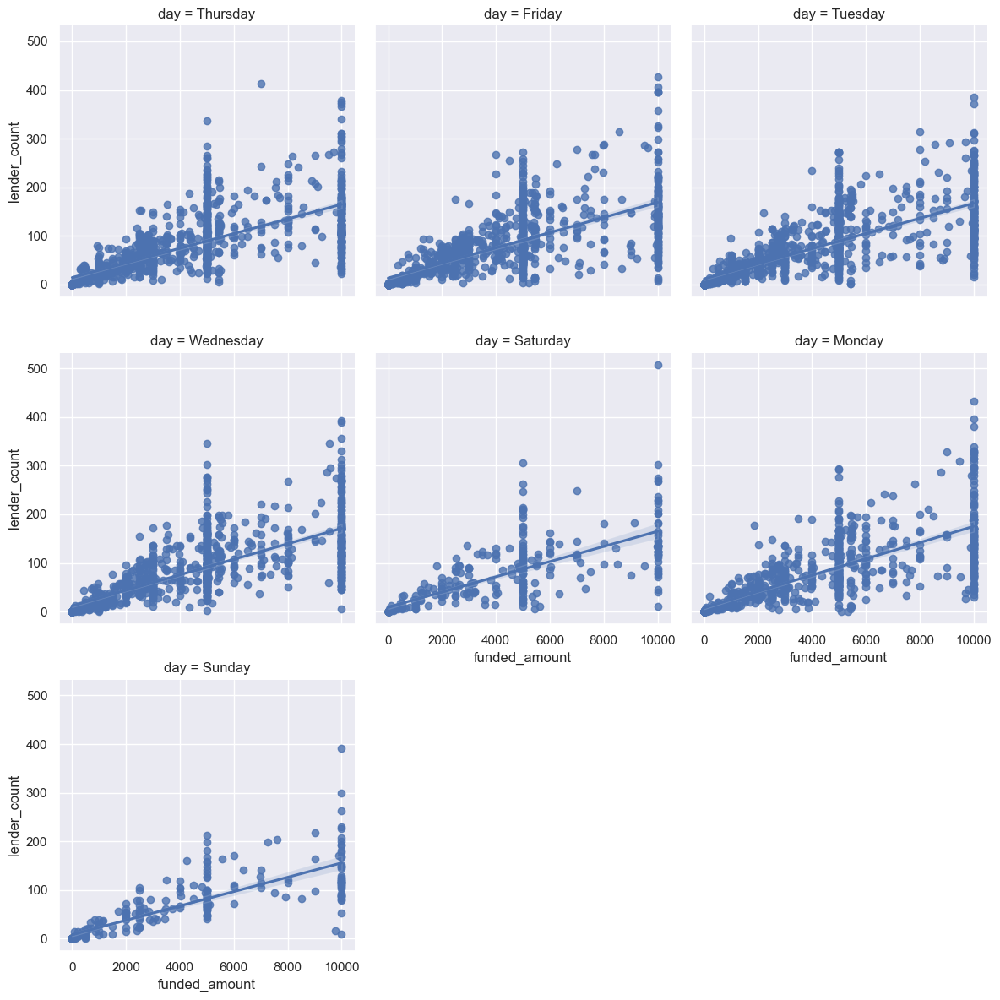

In [128]:
sns.lmplot(x="funded_amount", y="lender_count", col="day", data=usa,col_wrap=3, height=4)

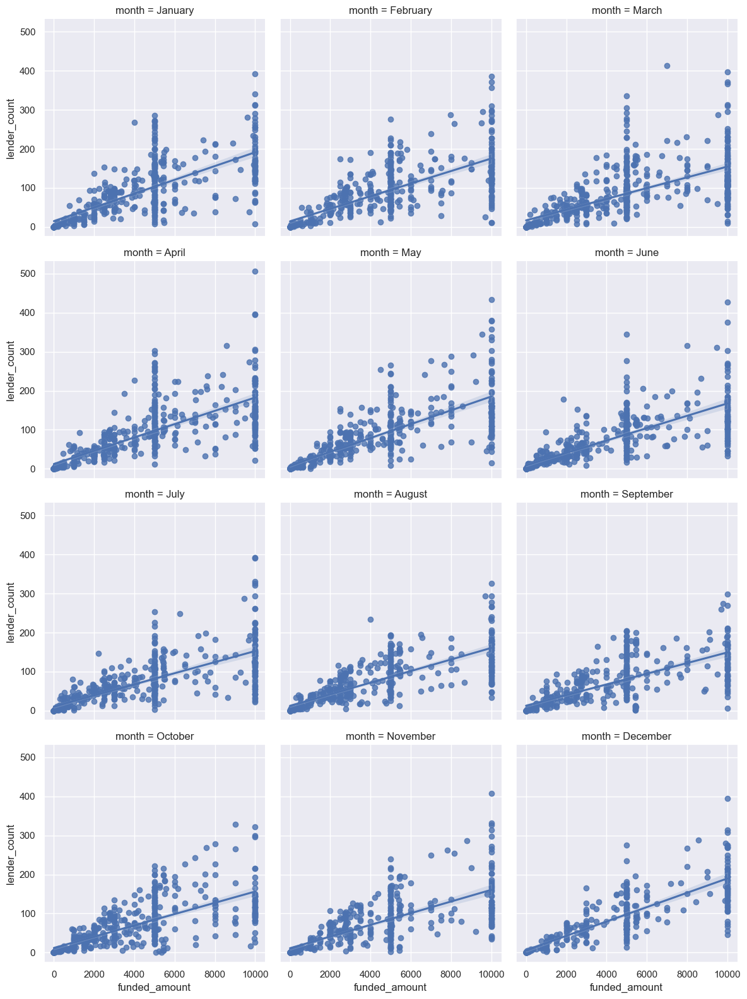

In [129]:
sns.lmplot(x="funded_amount", y="lender_count", col="month", data=usa,col_wrap=3, height=4)

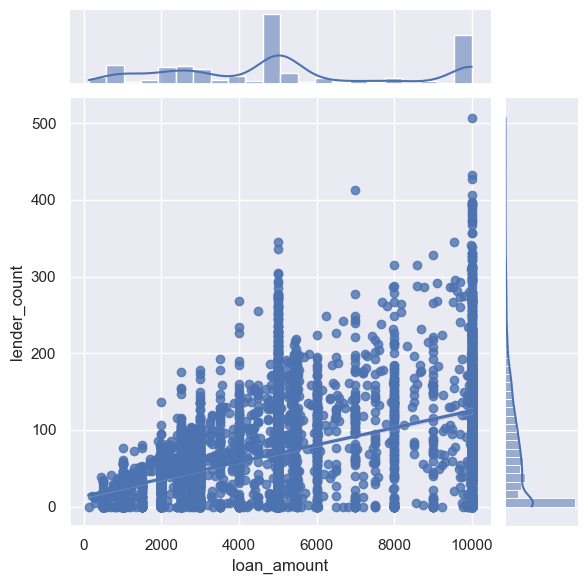

In [130]:
sns.jointplot(x="loan_amount", y="lender_count", data=usa, kind="reg")

## Seaborn Multi-Plot Grids

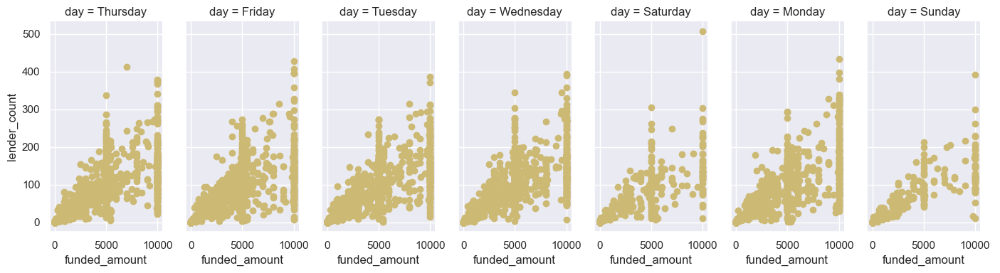

In [131]:
g = sns.FacetGrid(usa, col="day",height=4, aspect=.5)   # Multi-plot grid

g.map(plt.scatter, "funded_amount", "lender_count", color='y')

g.add_legend()

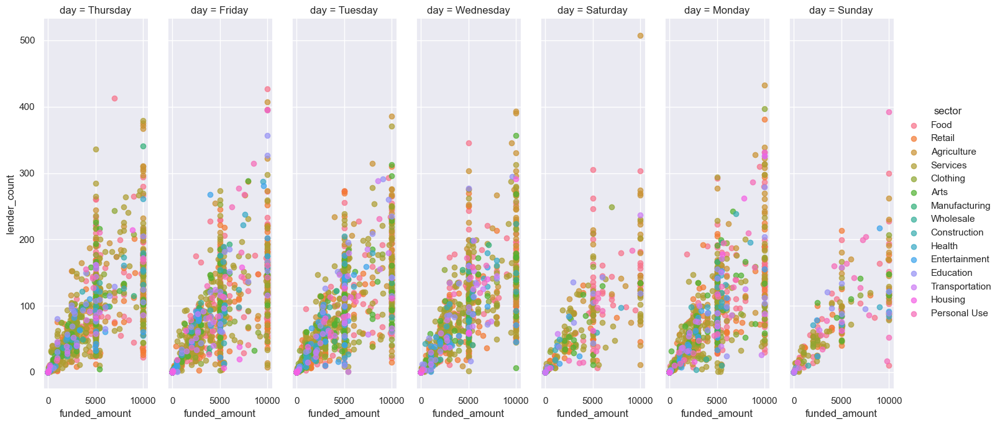

In [132]:
g = sns.FacetGrid(usa, col="day",height=7, aspect=0.3,hue="sector")

g.map(plt.scatter, "funded_amount", "lender_count", alpha=.7)

g.add_legend()

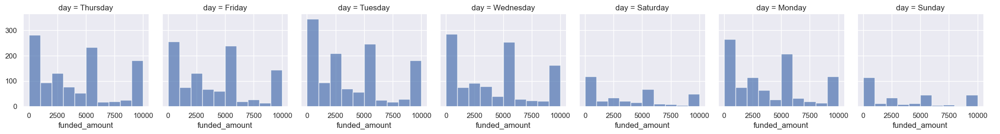

In [133]:
g = sns.FacetGrid(usa, col="day")

g.map(plt.hist, "funded_amount", alpha=.7)

g.add_legend()

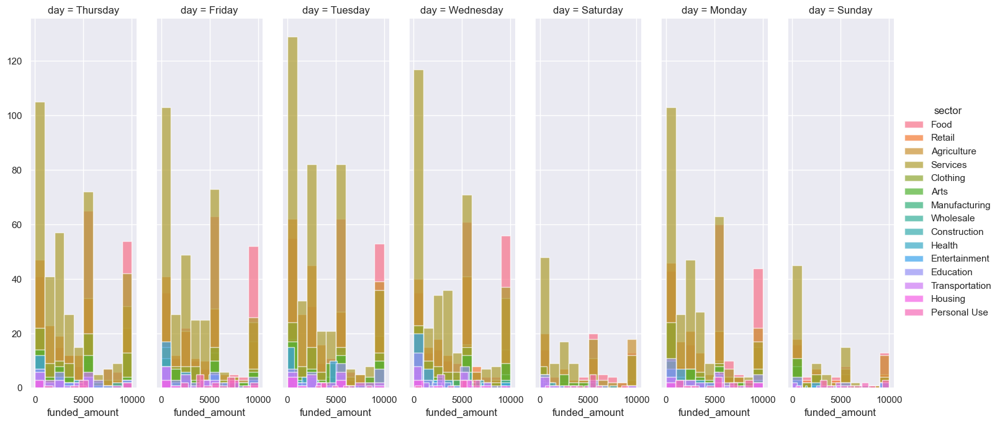

In [134]:
g = sns.FacetGrid(usa, col="day", height=7, aspect=0.3,hue="sector")

g.map(plt.hist, "funded_amount", alpha=.7)

g.add_legend()

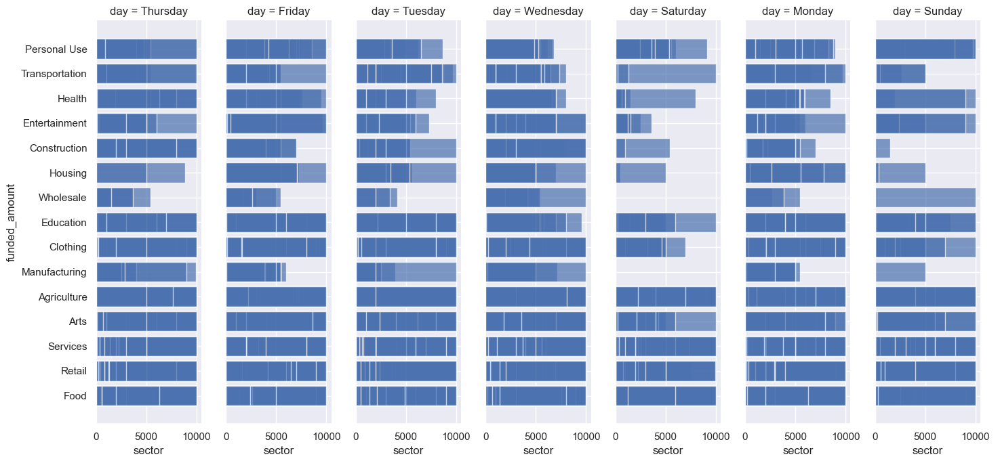

In [135]:
g = sns.FacetGrid(usa, col="day",height=7, aspect=0.3)

g.map(plt.barh, "sector", "funded_amount", alpha=.7)

g.add_legend()

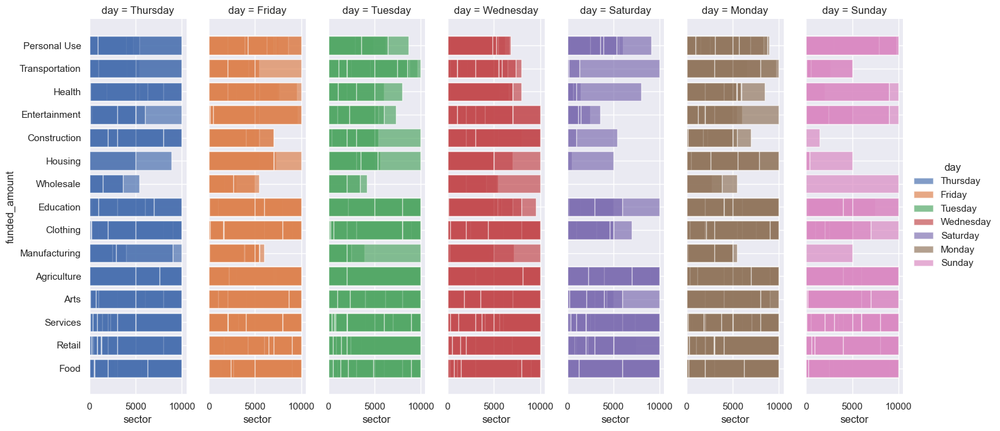

In [136]:
g = sns.FacetGrid(usa, col="day",height=7, aspect=0.3,hue='day')

g.map(plt.barh, "sector", "funded_amount", alpha=.7)

g.add_legend()

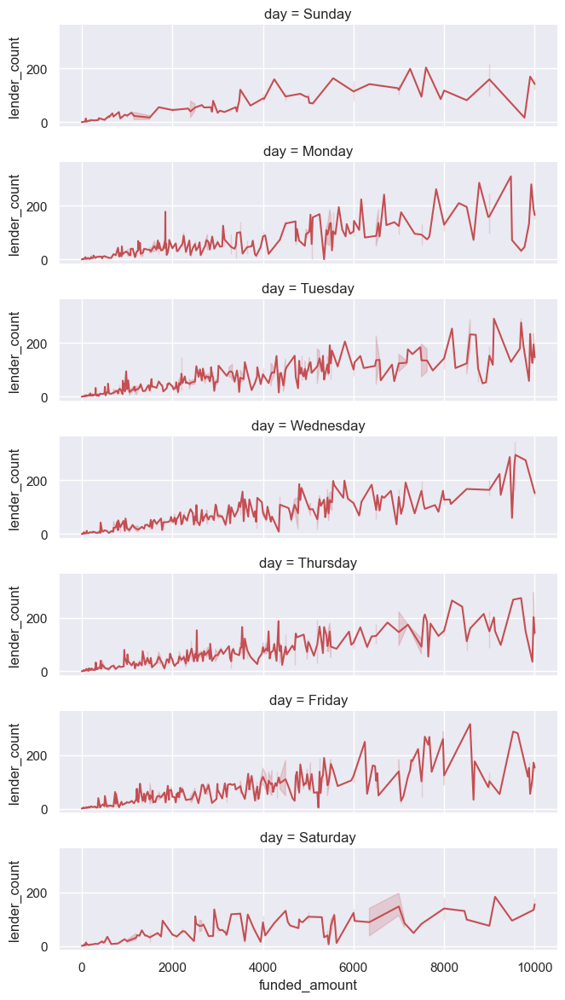

In [137]:
ordered_days = ['Sunday','Monday','Tuesday','Wednesday','Thursday','Friday','Saturday']

g = sns.FacetGrid(usa, row="day", row_order=ordered_days, height=1.7, aspect=4)

g.map(sns.lineplot, "funded_amount","lender_count",color='r')

### PairGrid

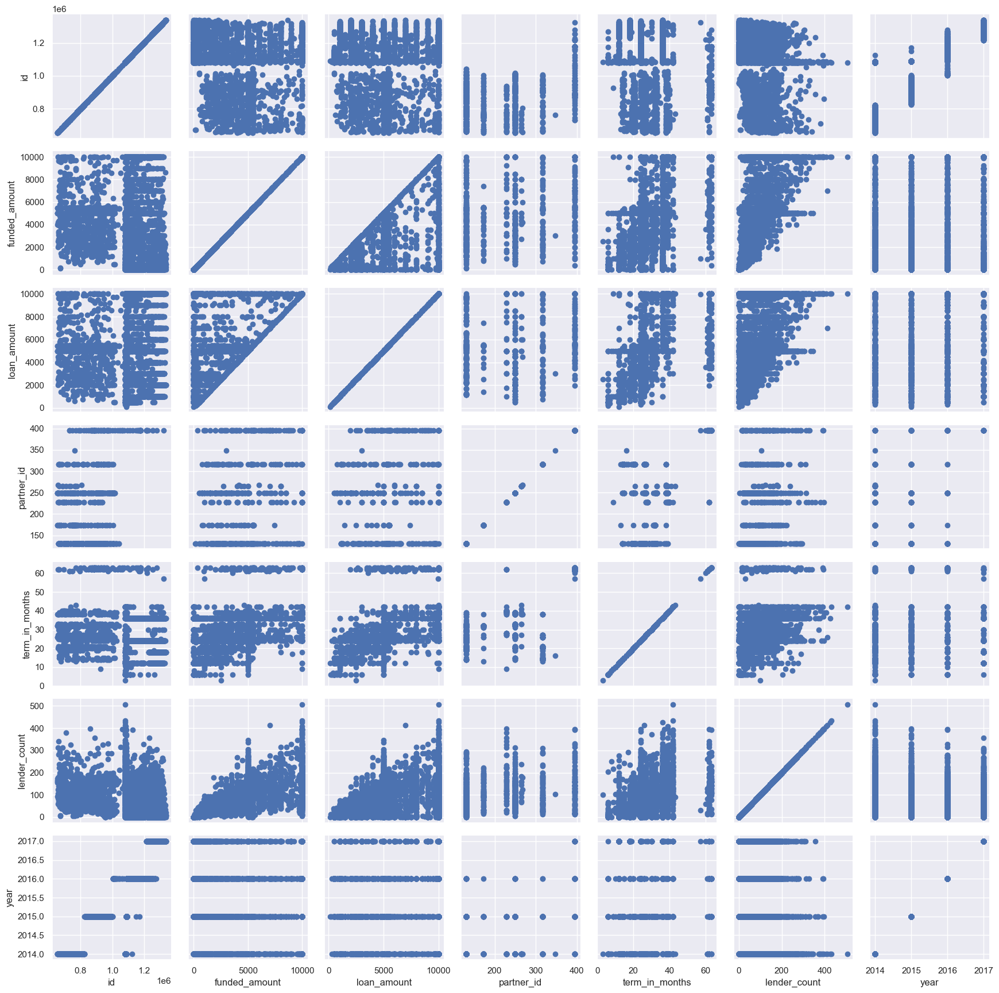

In [138]:
g = sns.PairGrid(usa)

g.map(plt.scatter)

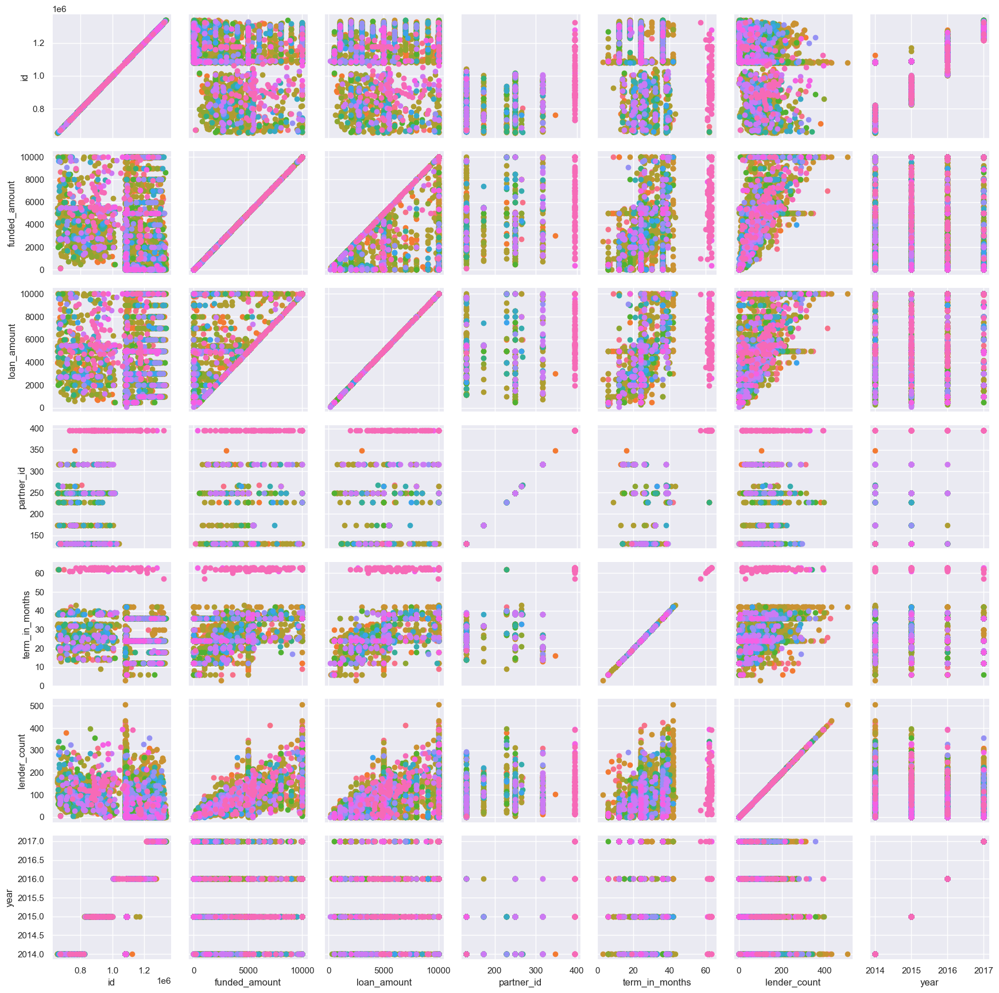

In [139]:
g = sns.PairGrid(usa,hue='sector')

g.map(plt.scatter)

### Word Cloud Section

In [140]:
from wordcloud import WordCloud, STOPWORDS # stopwords e.g. the, a, for 

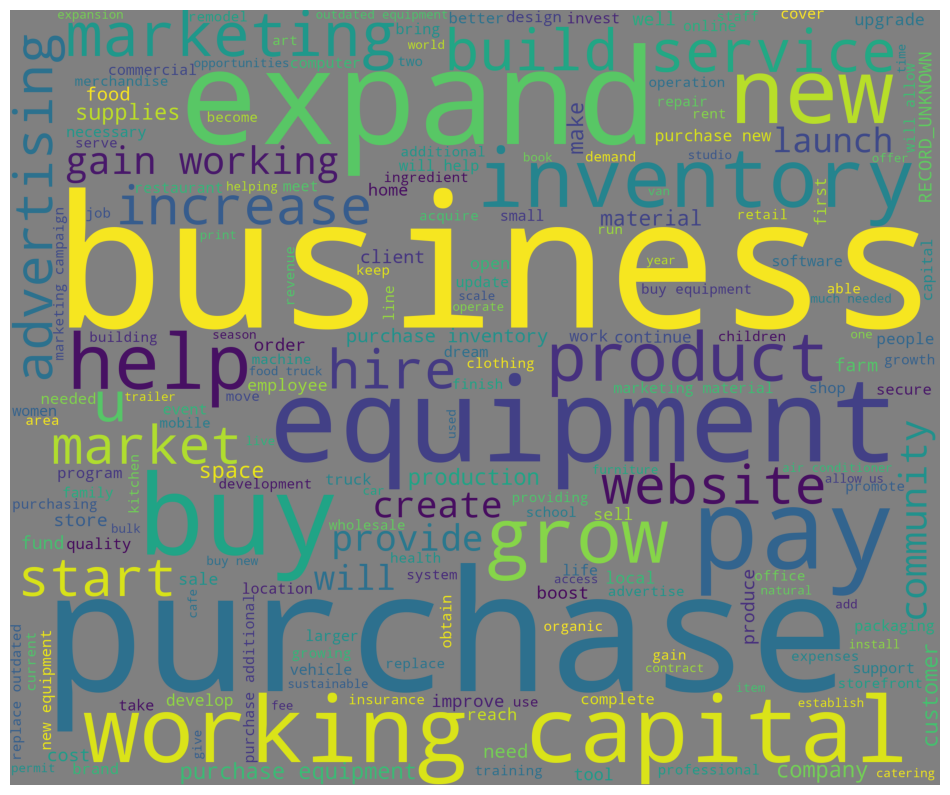

In [141]:
corpus = ' '.join(usa['use'].astype(str)) # a collection of sentences

wordcloud = WordCloud(stopwords=STOPWORDS,background_color='grey',width=2400,height=2000).generate(corpus)

plt.figure(figsize=(12,15))

plt.imshow(wordcloud)

plt.axis('off')

plt.show()

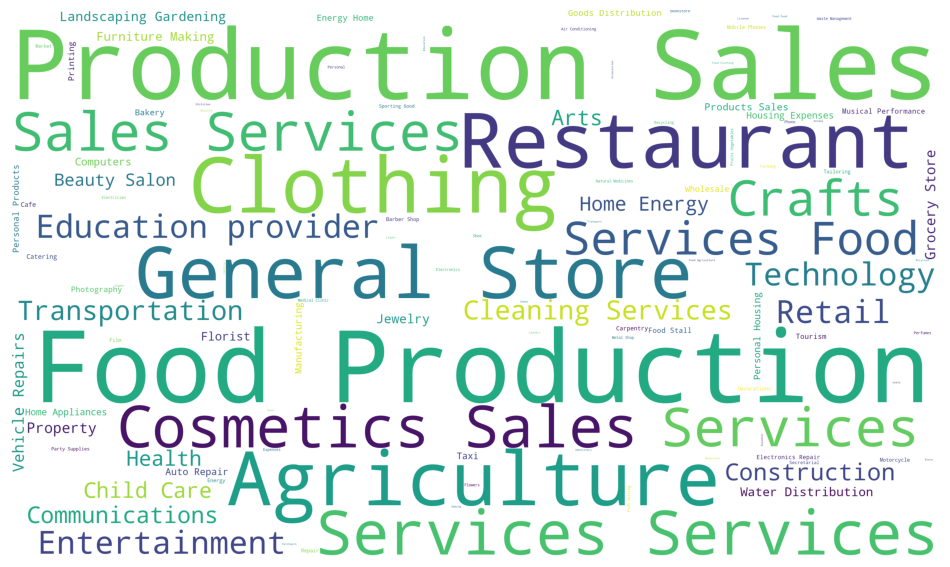

In [142]:
corpus = ' '.join(usa['activity'])

wordcloud = WordCloud(stopwords=STOPWORDS, background_color='white',width=3400,height=2000).generate(corpus)

plt.figure(figsize=(12,15))

plt.imshow(wordcloud)

plt.axis('off')

plt.show()